# Notebook for exploring RNA-seq data in transcripts per million

Collaborators: 
* Vrishabhadev Sathish Kumar
* PI: Erin Wilson

Data files:
* RNA-seq output from barrelseq pipeline
* mapping from sample id to experiment condition

In [87]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import math

***
# Navigation:

### [Exploration](#exp)

### [Detailed ToDo](#todo)

### [Data QC](#data_qc)

### [Dimensionality Reduction](#dim_red)

### [Clustering](#clustering)

### [Practice](#practice)

***

## Load tpm data and sample2condition mapping

<a id = "exp"></a>

In [42]:
# load TPM data
tpm_data_file = 'data/TPM_counts.tsv'
sample2condition_file = 'data/sample2condition.txt'

# load TPM data
df = pd.read_csv(tpm_data_file,sep='\t').fillna('')

    
# load mapping from sample to condition
with open(sample2condition_file,'r') as f:
    sample2condition = dict(x.strip().split() for x in f.readlines())


In [88]:
# View first 5 rows of the Dataframe
df

,locus_tag,product,type,gene_symbol,locus,start_coord,end_coord,note,translation,gene_len,...,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm
0,EQU24_RS00005,chromosomal replication initiator protein DnaA,CDS,dnaA,NZ_CP035467.1,0,1317,Derived by automated computational analysis us...,MSALWNNCLAKLENEISSSEFSTWIRPLQAIETDGQIKLLAPNRFV...,1318,...,38.557373,38.810668,37.444214,40.246006,40.100118,33.432274,39.880174,38.355431,30.247582,41.248441
1,EQU24_RS00010,DNA polymerase III subunit beta,CDS,,NZ_CP035467.1,1502,2603,Derived by automated computational analysis us...,MKYIINREQLLVPLQQIVSVIEKRQTMPILSNVLMVFRENTLVMTG...,1102,...,52.552767,52.461746,42.676553,49.210083,46.798476,48.142385,45.465136,46.498139,37.152951,52.902410
2,EQU24_RS00015,DNA replication/repair protein RecF,CDS,recF,NZ_CP035467.1,3060,4140,Derived by automated computational analysis us...,MSLQKLDIFNVRNIRQASLQPSPGLNLIYGANASGKSSVLEAIFIL...,1081,...,31.350991,34.914128,21.479309,24.204682,22.171104,22.006566,22.658157,22.753325,19.407103,29.834124
3,EQU24_RS00020,DNA topoisomerase (ATP-hydrolyzing) subunit B,CDS,gyrB,NZ_CP035467.1,4185,6600,Derived by automated computational analysis us...,MSENIKQYDSTNIQVLKGLDAVRKRPGMYIGDTDDGTGLHHMVFEV...,2416,...,74.848501,80.850761,54.959319,64.911376,59.653059,64.648318,69.119079,65.643179,57.590223,68.306759
4,EQU24_RS00025,hypothetical protein,CDS,,NZ_CP035467.1,6825,7062,Derived by automated computational analysis us...,VKTTKYFLTTRMRPDREIIKDEWIQYVVRFPENEHIQFDGRIRRWA...,238,...,50.324948,49.349547,34.539657,36.521074,37.789611,39.358066,38.992158,35.870964,41.462392,40.227192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,EQU24_RS22135,tRNA uridine-5-carboxymethylaminomethyl(34) sy...,CDS,mnmE,NZ_CP035467.1,4994941,4996288,Derived by automated computational analysis us...,VDIGTNDTIAAIATPPGNGGVGIVRISGPAVSIIAAKLTDRPLPPR...,1348,...,70.918047,92.044879,20.691249,26.000334,20.753333,30.766617,22.101468,19.753259,20.027390,24.508375
4209,EQU24_RS22140,membrane protein insertase YidC,CDS,yidC,NZ_CP035467.1,4996295,4997993,Derived by automated computational analysis us...,MDNIRFILVVTFAMLLYMLYDAWQIDYGPKREISVAQQMPQDLKED...,1699,...,328.789579,403.009110,105.587429,138.423469,100.648922,166.101675,96.169044,93.527806,89.780995,130.851229
4210,EQU24_RS22145,membrane protein insertion efficiency factor YidD,CDS,yidD,NZ_CP035467.1,4997998,4998220,Derived by automated computational analysis us...,MRVLLIAIIKLYQYFISPLLGKNCRFYPSCSCYALEALHKHGAAQG...,223,...,301.203428,329.903989,69.198876,75.440610,62.460976,59.523445,47.641158,60.667488,55.739018,66.415222
4211,EQU24_RS22150,ribonuclease P protein component,CDS,rnpA,NZ_CP035467.1,4998201,4998570,Derived by automated computational analysis us...,LTNKVFSFPPQLRLRKPSEYKKVFTGPVKSSDAYFTLLAVRNELDH...,370,...,550.448048,679.393946,202.139374,195.134615,214.993010,259.828426,134.795621,160.260255,174.197473,164.123473


This data frame has 4213 rows: each row is a locus in the 5G genome for which RNA-seq data was captured.

In [44]:
df.shape

(4213, 108)

The data frame also has 108 columns! The first 10 columns have information about the locus, like its ID, it's type, the gene product it makes, its amino acid translation, its start and end coordinates, etc.

In [45]:
# columns with info about each locus
list(df.columns[:10])

['locus_tag',
 'product',
 'type',
 'gene_symbol',
 'locus',
 'start_coord',
 'end_coord',
 'note',
 'translation',
 'gene_len']

The remaining columns are sample names of different RNA-seq experiments run in the Lidstrom lab. Each column contains the Trascript Per Million (TPM) value for every gene in that particular experiment. 

In [46]:
# a few sample names from RNA-seq experiments
list(df.columns[11:21])

['5GB1_ferm_WT_QC_tpm',
 '5GB1_FM03_TR1_QC_tpm',
 '5GB1_FM03_TR2_QC_tpm',
 '5GB1_FM11_TR1_QC_tpm',
 '5GB1_FM11_TR2_QC_tpm',
 '5GB1_FM12_TR1_tpm',
 '5GB1_FM12_TR1_QC_tpm',
 '5GB1_FM12_TR2_tpm',
 '5GB1_FM12_TR2_QC_tpm',
 '5GB1_FM14_TR1_tpm']

In addition to the DataFrame, we also have a dictionary mapping each sample name to the "experimental condition" category to which it belongs. Experimental conditions help us group together which samples were run in similar biological conditions. Some of the samples are actual experimental replicates, but some are just experiments run by different people that had similar objectives. 

In [91]:
# python dictionary
sample2condition

98

# Data Exploration: Part 1
Start to explore the data in this pandas `DataFrame` object and answer the following questions:
1. How many loci are of each `type`?
1. What `product` is made by `locus_tag` "EQU24_RS19315"?
1. What is the longest locus?
1. How many loci exist between genome coordinates 100,000 and 200,000?
1. What's the highest expressed locus in the whole data frame?
    * What `type` of locus is it and what `product` does it make?
1. What's the highest expressed locus in of `type` "CDS"? Report `product` and `gene_symbol`.
    * Overall? 
    * For each sample?


In [48]:
# Your code and visualizations here

# Task1
# prints out the number of distinct elements in this column --> 2nd index in DF is type
print("**Task1**\n\nNumber of loci types: ", str(df.nunique()['type']))


print("For each loci:\n", df['type'].value_counts())


# Task 2
print("\n**Task2**\n\nProduct made by `locus_tag` EQU24_RS19315: ", df.loc[df.locus_tag == "EQU24_RS19315", 'product'])


# Task 3
print("\n**Task3**\n\nLongest Locus (assuming gene length): ", df.gene_len.max())

# Task 4
print("\n**Task4**\n\nNumber of loci between genome coordinates 100,000 to 200,000: ", 
          df[(df['start_coord'] >= 100000) & (df['end_coord'] <= 200000)].shape[0])

# Task 5 
print("\n**Task5**\n\n")
    #select the right row for the most expressed locus --> question: how do we define greatest expression? 
    

# Task 6
print("\n**Task6**\n\n")
    #select the right row for the most expressed locus --> question: how do we define greatest expression?

**Task1**

Number of loci types:  5
For each loci:
 CDS      4155
tRNA       45
rRNA        9
ncRNA       3
tmRNA       1
Name: type, dtype: int64

**Task2**

Product made by `locus_tag` EQU24_RS19315:  3671    methane monooxygenase/ammonia monooxygenase su...
Name: product, dtype: object

**Task3**

Longest Locus (assuming gene length):  18316

**Task4**

Number of loci between genome coordinates 100,000 to 200,000:  95

**Task5**



**Task6**




# Data Exploration: Part 2
Now let's think about adding experimental condition information to these samples. I find this easiest if we transpose the `DataFrame` so that the columns become genes (`locus_tag`s) and the rows are samples)

In [49]:
# list of all samples
samples = list(sample2condition.keys())

# transpose dataframe to make experiments the rows and genes the columns
df_T = df.set_index('locus_tag')[samples].T.reset_index().rename(columns={'index':'sample'})
# ^^ kinda gross pandas syntax... try to understand what each part does

In [50]:
df_T

locus_tag,sample,EQU24_RS00005,EQU24_RS00010,EQU24_RS00015,EQU24_RS00020,EQU24_RS00025,EQU24_RS00030,EQU24_RS00035,EQU24_RS00040,EQU24_RS00045,...,EQU24_RS22110,EQU24_RS22115,EQU24_RS22120,EQU24_RS22125,EQU24_RS22130,EQU24_RS22135,EQU24_RS22140,EQU24_RS22145,EQU24_RS22150,EQU24_RS22155
0,5GB1_ferm_Ack_QC_tpm,2.933003,1.607784,1.415515,3.200081,1.522728,2.013385,8.890269,1.632474,0.790911,...,170.826337,0.973237,2.344352,2.331287,4.867523,2.300157,5.261582,9.389775,21.657488,27.832080
1,5GB1_ferm_WT_QC_tpm,6.033848,3.895284,2.549771,4.301580,3.797084,1.694449,9.506517,3.340407,2.160868,...,259.349616,2.866741,1.856930,0.951269,3.972334,3.217944,12.526353,21.072962,42.254357,41.530602
2,5GB1_FM03_TR1_QC_tpm,48.864921,51.315629,33.906257,64.584281,74.801354,13.090237,50.320911,20.811187,21.910217,...,6655.778183,56.948463,52.002311,60.628466,23.015801,104.488835,379.686212,500.129230,1191.565348,796.964423
3,5GB1_FM03_TR2_QC_tpm,52.197450,54.947425,29.979783,72.717824,62.709260,24.874673,71.255094,19.773190,19.421485,...,6480.237054,50.243190,41.376658,66.581832,54.669612,103.864151,401.742811,495.262554,1232.784967,724.291958
4,5GB1_FM11_TR1_QC_tpm,25.751902,37.216017,21.716802,53.032824,46.348014,42.426259,58.772307,9.667881,8.212313,...,6651.883413,25.635202,29.059082,59.545627,34.189659,78.264069,208.094267,260.011454,666.589153,461.697526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,5GB1C-5G-N-BR2_tpm,33.432274,48.142385,22.006566,64.648318,39.358066,34.654512,107.541275,33.869275,23.770815,...,9003.930101,20.600870,37.114422,39.499880,42.467068,30.766617,166.101675,59.523445,259.828426,404.714461
94,5GB1C-JG15-La-BR1_tpm,39.880174,45.465136,22.658157,69.119079,38.992158,67.033753,130.729298,39.968258,22.454067,...,3318.767885,10.724405,39.422680,49.109710,46.810258,22.101468,96.169044,47.641158,134.795621,265.487592
95,5GB1C-JG15-La-BR2_tpm,38.355431,46.498139,22.753325,65.643179,35.870964,51.959561,120.575354,37.092594,20.769383,...,3458.558649,15.496249,41.910716,53.086286,44.827579,19.753259,93.527806,60.667488,160.260255,308.428817
96,5GB1C-JG15-N-BR1_tpm,30.247582,37.152951,19.407103,57.590223,41.462392,44.527488,105.320613,27.798238,18.873435,...,3997.726513,17.356475,41.685308,44.836637,47.307203,20.027390,89.780995,55.739018,174.197473,286.670085


Now use pandas' apply function to add a column for `exp_condition`

In [51]:
# your code here (add exp_condition column)
df_T['exp_condition'] = df_T['sample'].apply(lambda x: sample2condition.get(x))


# since the number of exp_conditions depends on the particlar tested sample (we can 
# just count the number of rows)
df_T.head()





locus_tag,sample,EQU24_RS00005,EQU24_RS00010,EQU24_RS00015,EQU24_RS00020,EQU24_RS00025,EQU24_RS00030,EQU24_RS00035,EQU24_RS00040,EQU24_RS00045,...,EQU24_RS22115,EQU24_RS22120,EQU24_RS22125,EQU24_RS22130,EQU24_RS22135,EQU24_RS22140,EQU24_RS22145,EQU24_RS22150,EQU24_RS22155,exp_condition
0,5GB1_ferm_Ack_QC_tpm,2.933003,1.607784,1.415515,3.200081,1.522728,2.013385,8.890269,1.632474,0.790911,...,0.973237,2.344352,2.331287,4.867523,2.300157,5.261582,9.389775,21.657488,27.832080,lowO2_slow_growth
1,5GB1_ferm_WT_QC_tpm,6.033848,3.895284,2.549771,4.301580,3.797084,1.694449,9.506517,3.340407,2.160868,...,2.866741,1.856930,0.951269,3.972334,3.217944,12.526353,21.072962,42.254357,41.530602,lowO2_slow_growth
2,5GB1_FM03_TR1_QC_tpm,48.864921,51.315629,33.906257,64.584281,74.801354,13.090237,50.320911,20.811187,21.910217,...,56.948463,52.002311,60.628466,23.015801,104.488835,379.686212,500.129230,1191.565348,796.964423,uMax
3,5GB1_FM03_TR2_QC_tpm,52.197450,54.947425,29.979783,72.717824,62.709260,24.874673,71.255094,19.773190,19.421485,...,50.243190,41.376658,66.581832,54.669612,103.864151,401.742811,495.262554,1232.784967,724.291958,uMax
4,5GB1_FM11_TR1_QC_tpm,25.751902,37.216017,21.716802,53.032824,46.348014,42.426259,58.772307,9.667881,8.212313,...,25.635202,29.059082,59.545627,34.189659,78.264069,208.094267,260.011454,666.589153,461.697526,lowO2_fast_growth


In [52]:
print("Number of unique exp conditions: " + str(df_T['exp_condition'].nunique()))
num_conditions = df_T['exp_condition'].nunique()

print("Number of samples per exp conditions: \n" + str(pd.value_counts(df_T['exp_condition'])))

Number of unique exp conditions: 19
Number of samples per exp conditions: 
uMax                     12
lowO2_fast_growth        12
lowCH4                    8
lowCu                     8
medCu                     7
MeOH                      7
NoLanthanum               5
highCu                    5
unknown                   5
WithLanthanum             5
highO2_slow_growth        4
NO3_lowO2_slow_growth     4
NoCu                      3
lowO2_slow_growth         3
slow_growth               2
crotonic_acid             2
WT_control                2
LanzaTech                 2
aa3_KO                    2
Name: exp_condition, dtype: int64


Explore these questions:
* How many unique `exp_conditions` are there?
* How many samples belong to each `exp_condition`?

# Data Exploration Part 3

With this transposed `DataFrame` that incorporates the `exp_condition` column, we can more easily calculate the average TPM expression of each locus in each experimental condition. The new `DataFrame` will have the same number of columns (locus tags + sample name). But it should only have N rows (where N is the number of unique experimental conditions)

In [53]:
# your code here 
#(create a new df containing the AVERAGE TPM experession of each locus_tag in 
#each exp_condition)

df

df_Avg = df_T.groupby(['exp_condition']).mean()
df_Avg


locus_tag,EQU24_RS00005,EQU24_RS00010,EQU24_RS00015,EQU24_RS00020,EQU24_RS00025,EQU24_RS00030,EQU24_RS00035,EQU24_RS00040,EQU24_RS00045,EQU24_RS00050,...,EQU24_RS22110,EQU24_RS22115,EQU24_RS22120,EQU24_RS22125,EQU24_RS22130,EQU24_RS22135,EQU24_RS22140,EQU24_RS22145,EQU24_RS22150,EQU24_RS22155
exp_condition,,,,,,,,,,,,,,,,,,,,,
LanzaTech,25.626702,55.711920,11.804042,76.880335,43.737438,27.940983,35.296053,25.926725,23.461781,25.929209,...,7420.641716,16.014544,15.947067,16.286482,9.514666,46.013885,354.315359,157.364073,571.458102,613.084675
MeOH,23.323155,18.905775,18.443916,18.257805,16.950643,12.367795,43.805536,9.660950,7.292145,9.568570,...,1298.247682,15.614619,20.198066,25.994364,20.950234,28.709983,93.606437,161.518124,496.980651,280.334047
NO3_lowO2_slow_growth,32.040358,43.646760,21.341623,62.257687,41.674925,31.911455,57.839768,16.875694,14.916147,13.952268,...,6497.858109,26.263485,28.935133,23.515245,26.422667,35.157264,178.986199,164.073806,433.428735,493.885115
NoCu,44.338687,59.619360,28.258717,56.808319,49.829406,38.384652,81.520362,40.491969,36.566500,27.046153,...,8345.775345,43.055124,34.370565,44.409579,34.591933,65.329879,253.598495,273.274694,731.042190,1087.611126
NoLanthanum,33.434023,43.679839,23.162675,57.287047,42.357072,41.931657,102.503601,30.216787,19.452312,17.138966,...,5085.627409,16.413284,35.578138,44.613117,43.191743,21.917260,109.773330,67.267718,211.565175,328.933746
WT_control,34.988452,38.272163,15.495930,54.855025,35.396786,26.817623,59.558466,24.797995,27.925137,22.640284,...,4939.367129,18.248719,21.027514,31.490596,45.810743,36.195898,172.298263,181.468991,403.551659,648.122601
WithLanthanum,35.452185,41.782237,20.634554,57.120166,34.248335,46.191637,110.711781,31.803805,19.428086,17.304281,...,3942.947792,15.962203,34.308829,49.206725,39.990662,21.210809,98.090610,73.106973,194.379586,319.988959
aa3_KO,26.849583,45.489035,11.962099,55.846659,33.097353,28.718155,50.249664,21.490715,24.790508,18.955507,...,5355.094603,16.236806,20.836285,28.298842,40.627394,30.065630,181.790564,153.928317,376.664997,657.228922
crotonic_acid,38.684021,52.507256,33.132559,77.849631,49.837247,37.332021,69.675355,32.001867,35.856260,35.008462,...,8680.904376,42.175374,47.879804,58.961083,43.069352,81.481463,365.899345,315.553709,614.920997,676.638496


In [54]:
list_conditions = df_Avg.T.columns
list_conditions

Index(['LanzaTech', 'MeOH', 'NO3_lowO2_slow_growth', 'NoCu', 'NoLanthanum',
       'WT_control', 'WithLanthanum', 'aa3_KO', 'crotonic_acid', 'highCu',
       'highO2_slow_growth', 'lowCH4', 'lowCu', 'lowO2_fast_growth',
       'lowO2_slow_growth', 'medCu', 'slow_growth', 'uMax', 'unknown'],
      dtype='object', name='exp_condition')

With the `DataFrame` that now contains the average TPM expression across conditions, explore these questions:
* What are the top 5 loci in each `exp_condition`?
* In which `exp_condition` is "EQU24_RS19520" most highly expressed? Least highly expressed?
* For each `exp_condition`, what is the distribution of gene expression? (Try visualizing! Histogram, boxplot, violinplot, etc)


In [55]:
# Top 5 loci for each exp_condition: 

topn = 5
df_temp = df_Avg.T

df_top_loci = pd.DataFrame(columns=('top1', 'top2', 'top3', 'top4', 'top5'))


for condition in df_temp.columns:
    list_loci = df_temp[condition].nlargest(topn).index.tolist()
    temp_series = pd.Series(list_loci, index = df_top_loci.columns)
    temp_series.name = condition
    df_top_loci = df_top_loci.append(temp_series)

df_top_loci

    

#df_Avg.idxmax(axis=1)
#.apply(lambda s: s.abs().nlargest(5).index.tolist(), axis=1)



# newdf.columns = ['top 1 loci','top 2 loci', 'top 3 loci', "top 4 loci", "top 5 loci"]
#newdf


,top1,top2,top3,top4,top5
LanzaTech,EQU24_RS12525,EQU24_RS19315,EQU24_RS19305,EQU24_RS19310,EQU24_RS19765
MeOH,EQU24_RS12525,EQU24_RS19765,EQU24_RS04160,EQU24_RS19315,EQU24_RS19305
NO3_lowO2_slow_growth,EQU24_RS12525,EQU24_RS04160,EQU24_RS19315,EQU24_RS19310,EQU24_RS19305
NoCu,EQU24_RS12525,EQU24_RS19765,EQU24_RS19520,EQU24_RS19315,EQU24_RS05885
NoLanthanum,EQU24_RS12525,EQU24_RS16195,EQU24_RS19315,EQU24_RS19305,EQU24_RS19765
WT_control,EQU24_RS12525,EQU24_RS04160,EQU24_RS19315,EQU24_RS19305,EQU24_RS19310
WithLanthanum,EQU24_RS12525,EQU24_RS16195,EQU24_RS19315,EQU24_RS19305,EQU24_RS19765
aa3_KO,EQU24_RS12525,EQU24_RS19315,EQU24_RS19305,EQU24_RS19310,EQU24_RS04160
crotonic_acid,EQU24_RS12525,EQU24_RS19765,EQU24_RS19315,EQU24_RS04160,EQU24_RS19305
highCu,EQU24_RS12525,EQU24_RS19765,EQU24_RS19315,EQU24_RS19310,EQU24_RS19305


In [56]:
df_top_loci.T.columns

Index(['LanzaTech', 'MeOH', 'NO3_lowO2_slow_growth', 'NoCu', 'NoLanthanum',
       'WT_control', 'WithLanthanum', 'aa3_KO', 'crotonic_acid', 'highCu',
       'highO2_slow_growth', 'lowCH4', 'lowCu', 'lowO2_fast_growth',
       'lowO2_slow_growth', 'medCu', 'slow_growth', 'uMax', 'unknown'],
      dtype='object')

In [57]:
# Exp_condition where "EQU24_RS19520" is expresset most high and low: 

hi_exp = df_Avg['EQU24_RS19520'].idxmax()
print("The highest epxression of the loci EQU24_RS19520 was in condition: " + hi_exp)

lo_exp = df_Avg['EQU24_RS19520'].idxmin()
print("The lowest epxression of the loci EQU24_RS19520 was in condition: " + lo_exp)

The highest epxression of the loci EQU24_RS19520 was in condition: NoCu
The lowest epxression of the loci EQU24_RS19520 was in condition: WT_control


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

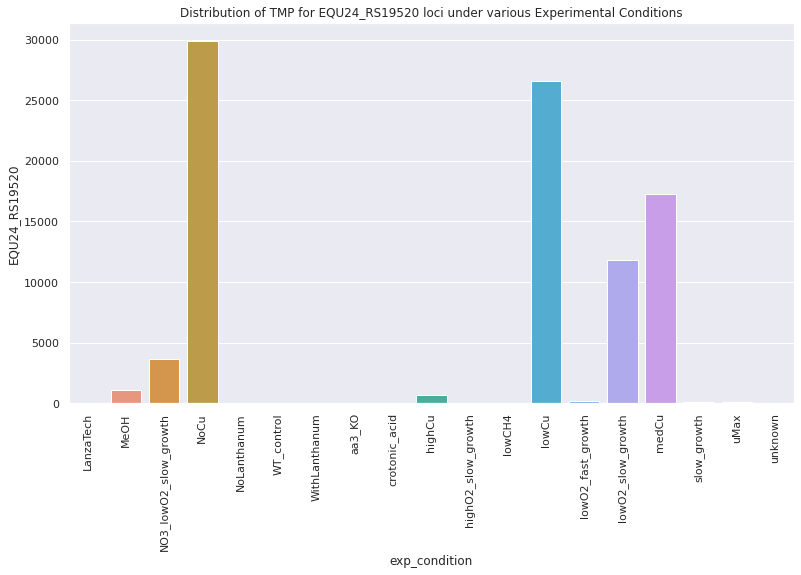

In [58]:
# Distribution of gene expression for EQU24_RS19520 by experimental condition
pl = sns.barplot(x = df_Avg.T.columns, y = 'EQU24_RS19520', data = df_Avg)
sns.set(rc={'figure.figsize':(13,7)})
pl.set_title("Distribution of TMP for EQU24_RS19520 loci under various Experimental Conditions")
plt.setp(pl.get_xticklabels(), rotation=90)


<a id = "todo"></a>

***
# TODO

* <u><b>Data QC</b></u>
    * correlation of samples within conditions
       * are there conditions we should exclude b/c poor quality? 
    * coefficient of variation
    * other QC?
        * top n% in all conditions
        * top n% in only 1 or 2 conditions
        * poor correlations with same conditions
    * outliers or other datapoints to filter out

* <u><b>Dimensionality Reduction</b></u>
    * apply different methods: 
        * PCA (Principal Component Analysis)
        * tSNE (t-distributed Stochastic Neighbor Embedding)
        * UMAP (Uniform Manifold Approximation and Projection) 
        * others -> LDA (linear discriminant analysis)

* <u><b>Clustering</b></u>
    * Cluster samples: does the clustering algorithm put the all the samples in the same bin? Are there any it confuses?
     * Cluster genes: can we identify modules of genes related to certain regulatory processes?
    * Clustering methods: k-means, k-NN, DBSCAN, more?
        * Assess cluster quality


***
<a id = "data_qc"></a>
# Data QC (cross-checking conditions)


### [Standard Raw Correlation](#raw_corr)
### [Log-Scaled Correlation](#log_corr)
### [Standard Scaled Correlation](#scaled_corr)


<a id = "raw_corr"></a>

## <u>Standard Data Correlation Visualization</u> 
### 1. All Samples on one Heatmap

In [59]:
# Filter raw dataset to just samples AND obtain their correlations
df_raw = df.iloc[:, 10:]
df_raw_corr = df_raw.corr()

# Stack -> reshape the dataframe so that column names get incorporated into the dataframe
# Reset Index -> resets indexes for new names
df_corr_values = (df_raw_corr
                       .stack()
                       .reset_index())

df_corr_values.columns = ['Sample 1','Sample 2','Corr Value']

# Add columns for the condition types for each of the samples present
df_corr_values['Condition 1'] = df_corr_values['Sample 1'].apply(lambda x: sample2condition.get(x))
df_corr_values['Condition 2'] = df_corr_values['Sample 2'].apply(lambda x: sample2condition.get(x))

df_corr_values

# #Other methods: 

# Melt: 
# # df_raw = df.iloc[:, 10:]
# # df_melted_raw = pd.melt(df_raw)

# Avoid Duplicates --> Upper Only:
#df_upper_only = df_raw_corr.where(np.triu(np.ones(df_raw_corr.shape)).astype(np.bool))
#df_corr_values = df_upper_only.stack().reset_index()


,Sample 1,Sample 2,Corr Value,Condition 1,Condition 2
0,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_Ack_QC_tpm,1.000000,lowO2_slow_growth,lowO2_slow_growth
1,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,0.986283,lowO2_slow_growth,lowO2_slow_growth
2,5GB1_ferm_Ack_QC_tpm,5GB1_FM03_TR1_QC_tpm,0.811274,lowO2_slow_growth,uMax
3,5GB1_ferm_Ack_QC_tpm,5GB1_FM03_TR2_QC_tpm,0.845524,lowO2_slow_growth,uMax
4,5GB1_ferm_Ack_QC_tpm,5GB1_FM11_TR1_QC_tpm,0.773777,lowO2_slow_growth,lowO2_fast_growth
...,...,...,...,...,...
9599,5GB1C-JG15-N-BR2_tpm,5GB1C-5G-N-BR2_tpm,0.983839,NoLanthanum,NoLanthanum
9600,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,0.893326,NoLanthanum,WithLanthanum
9601,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-La-BR2_tpm,0.883953,NoLanthanum,WithLanthanum
9602,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-N-BR1_tpm,0.901057,NoLanthanum,NoLanthanum


In [60]:
#SORT Correlations: 
df_sorted_sample_corr = df_corr_values.sort_values(["Condition 1"])
df_sorted_sample_corr

,Sample 1,Sample 2,Corr Value,Condition 1,Condition 2
7545,5GB1_LTrecycle_TR1_QC_tpm,5GB1C-JG15-N-BR2_tpm,0.874429,LanzaTech,NoLanthanum
7421,5GB1_LTrecycle_TR1_tpm,5GB1_FM80_t2_TR1_tpm,0.889363,LanzaTech,NO3_lowO2_slow_growth
7420,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t4_TR1_UW_tpm,0.879914,LanzaTech,highO2_slow_growth
7419,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t4_TR1_tpm,0.825712,LanzaTech,highO2_slow_growth
7418,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t3_TR1_UW_tpm,0.878604,LanzaTech,highO2_slow_growth
...,...,...,...,...,...
7964,br2_QC_tpm,5GB1_FM20_TR3_tpm,0.576806,unknown,uMax
7963,br2_QC_tpm,5GB1_FM20_TR2_QC_tpm,0.730854,unknown,uMax
7962,br2_QC_tpm,5GB1_FM20_TR1_QC_tpm,0.483279,unknown,uMax
7984,br2_QC_tpm,5GB1_FM34_T7_TR3_QC_tpm,0.676547,unknown,highCu


In [61]:
# OLD WORK-AROUND
#Sort the dataframe's samples in order of their condition: 

df_sorted = df.iloc[:, 10:]
df_sorted.columns = df_sorted.columns.to_series().map(sample2condition)
df_sorted = df_sorted.sort_index(axis = 1)

df_sample_corr = df_sorted.corr()
df_sample_corr

,LanzaTech,LanzaTech,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,NO3_lowO2_slow_growth,...,uMax,uMax,uMax,uMax,uMax,unknown,unknown,unknown,unknown,unknown
LanzaTech,1.000000,0.998307,0.799337,0.804266,0.764292,0.776732,0.790444,0.798993,0.803712,0.891513,...,0.742792,0.935165,0.930765,0.924664,0.891243,0.884326,0.850580,0.426677,0.345823,0.939124
LanzaTech,0.998307,1.000000,0.799088,0.803625,0.765742,0.778035,0.790911,0.798725,0.803053,0.889363,...,0.744156,0.936355,0.932033,0.925435,0.894343,0.883803,0.851649,0.430436,0.350036,0.940861
MeOH,0.799337,0.799088,1.000000,0.995292,0.958387,0.969591,0.991815,0.999998,0.995207,0.772357,...,0.766900,0.941787,0.941845,0.960370,0.932755,0.954851,0.902946,0.576433,0.481113,0.941889
MeOH,0.804266,0.803625,0.995292,1.000000,0.927593,0.942643,0.975885,0.995444,0.999999,0.775795,...,0.744267,0.931556,0.929771,0.954262,0.909701,0.965565,0.903848,0.495330,0.394689,0.934674
MeOH,0.764292,0.765742,0.958387,0.927593,1.000000,0.999079,0.986658,0.957871,0.927194,0.768692,...,0.838842,0.932942,0.938211,0.936851,0.963587,0.891484,0.885437,0.778915,0.703799,0.925257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unknown,0.884326,0.883803,0.954851,0.965565,0.891484,0.906915,0.939227,0.954859,0.965362,0.902544,...,0.840158,0.946591,0.943250,0.962701,0.921349,1.000000,0.973270,0.439665,0.339289,0.960102
unknown,0.850580,0.851649,0.902946,0.903848,0.885437,0.894305,0.909581,0.902654,0.903433,0.952492,...,0.936849,0.913574,0.912548,0.923096,0.913095,0.973270,1.000000,0.501303,0.411699,0.930715
unknown,0.426677,0.430436,0.576433,0.495330,0.778915,0.752292,0.669200,0.575053,0.494483,0.427232,...,0.634238,0.616408,0.631803,0.587947,0.720210,0.439665,0.501303,1.000000,0.993583,0.587734
unknown,0.345823,0.350036,0.481113,0.394689,0.703799,0.673724,0.581591,0.479634,0.393793,0.348095,...,0.571874,0.531086,0.547598,0.498099,0.643699,0.339289,0.411699,0.993583,1.000000,0.500620


In [62]:

# Reshapes data frame with new index, columns, AND value
df_rect_sorted_corr = df_sorted_sample_corr.pivot('Sample 1', 'Sample 2', 'Corr Value')
df_rect_sorted_corr


Sample 2,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm,5GB1C_latelog_vial_TR2_QC_tpm,5GB1_FM03_TR1_QC_tpm,...,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1_vial_wLa_TR3_tpm,5GB1_vial_woLa_TR2_tpm,br1_QC_tpm,br2_QC_tpm,ribo0_tpm,total_tpm
Sample 1,,,,,,,,,,,,,,,,,,,,,
5GB1C-5G-La-BR1_tpm,1.000000,0.961742,0.979030,0.927682,0.987608,0.988848,0.984258,0.859553,0.980016,0.956743,...,0.657142,0.756407,0.947834,0.963776,0.990261,0.989956,0.397717,0.489319,0.915677,0.960720
5GB1C-5G-La-BR2_tpm,0.961742,1.000000,0.967462,0.983657,0.959311,0.954109,0.960142,0.954852,0.921175,0.891510,...,0.591464,0.673150,0.879556,0.877275,0.929020,0.940364,0.382190,0.458059,0.844229,0.869845
5GB1C-5G-N-BR1_tpm,0.979030,0.967462,1.000000,0.963767,0.991755,0.994087,0.996616,0.917882,0.962401,0.936733,...,0.612449,0.706362,0.928267,0.930613,0.963929,0.981890,0.373696,0.460389,0.888196,0.927503
5GB1C-5G-N-BR2_tpm,0.927682,0.983657,0.963767,1.000000,0.949791,0.942624,0.955559,0.983839,0.889882,0.871797,...,0.585233,0.656180,0.844104,0.839807,0.887771,0.912174,0.402954,0.472455,0.810224,0.827863
5GB1C-JG15-La-BR1_tpm,0.987608,0.959311,0.991755,0.949791,1.000000,0.998661,0.996946,0.893326,0.965972,0.949277,...,0.643626,0.739698,0.932485,0.944690,0.974274,0.984820,0.395642,0.485216,0.904454,0.944947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5GB1_vial_woLa_TR2_tpm,0.989956,0.940364,0.981890,0.912174,0.984820,0.990082,0.983422,0.846891,0.973874,0.944392,...,0.595816,0.706707,0.953365,0.958204,0.995050,1.000000,0.319652,0.416346,0.923862,0.972881
br1_QC_tpm,0.397717,0.382190,0.373696,0.402954,0.395642,0.387972,0.419998,0.343741,0.500620,0.590104,...,0.938673,0.870227,0.444283,0.507464,0.323239,0.319652,1.000000,0.993583,0.411699,0.339289
br2_QC_tpm,0.489319,0.458059,0.460389,0.472455,0.485216,0.478958,0.507179,0.402807,0.587734,0.672227,...,0.971132,0.919798,0.533549,0.597712,0.421787,0.416346,0.993583,1.000000,0.501303,0.439665


CPU times: user 17 s, sys: 2.05 s, total: 19 s
Wall time: 18.8 s


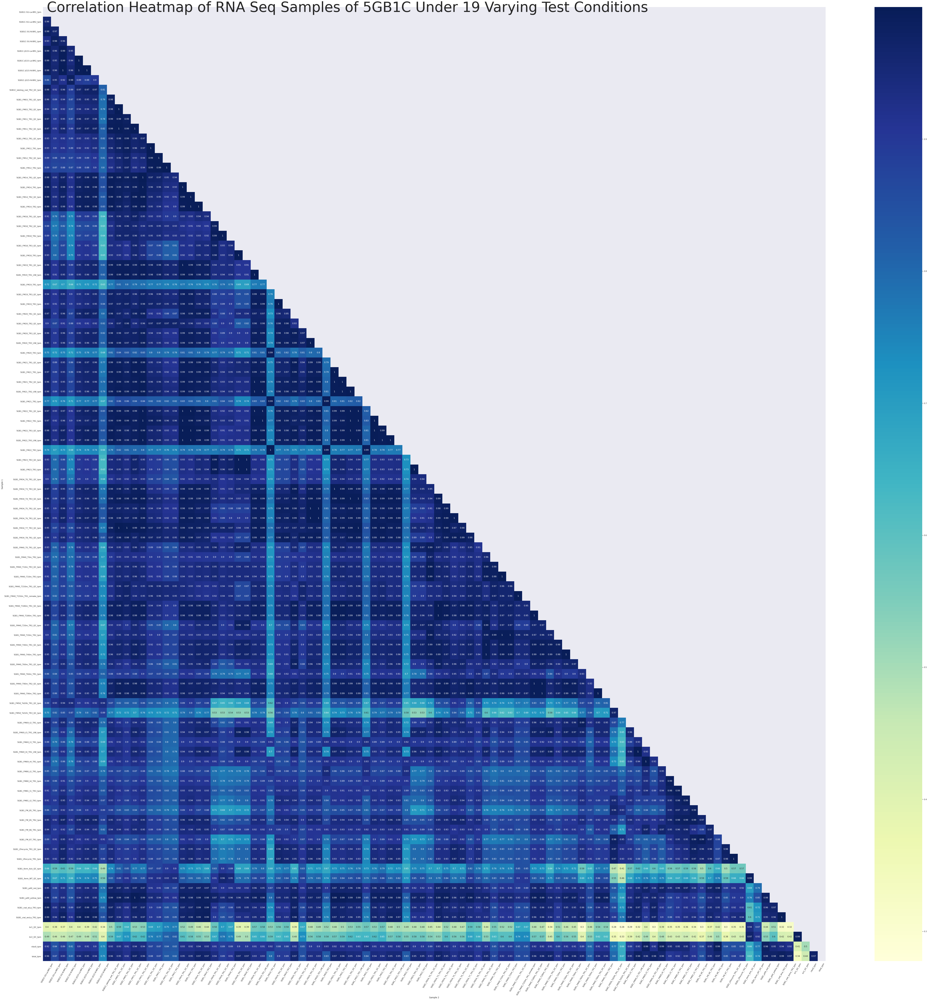

In [63]:
%%time

# Create Mask to Avoid Duplicates -> triangular heatmap for analysis
mask = np.zeros_like(df_rect_sorted_corr)
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True

fig = plt.figure(figsize = (100, 100))

heatmap = sns.heatmap(df_rect_sorted_corr, cmap="YlGnBu", mask = mask, annot = True)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=60)

plt.text(0.5, 0.5, s = "Correlation Heatmap of RNA Seq Samples of 5GB1C Under 19 Varying Test Conditions", fontsize = 80)
plt.xticks = 30
plt.yticks = 30
#plt.show
plt.savefig("raw_sample_corr.png")



### 2. Sorted Sample by Sample Visualization

In [64]:
# LanzaTech Example: 

s = df_sample_corr.loc["MeOH"]
s = s.T.loc["MeOH"]
s

,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH
MeOH,1.000000,0.995292,0.958387,0.969591,0.991815,0.999998,0.995207
MeOH,0.995292,1.000000,0.927593,0.942643,0.975885,0.995444,0.999999
MeOH,0.958387,0.927593,1.000000,0.999079,0.986658,0.957871,0.927194
MeOH,0.969591,0.942643,0.999079,1.000000,0.992626,0.969144,0.942282
MeOH,0.991815,0.975885,0.986658,0.992626,1.000000,0.991585,0.975659
MeOH,0.999998,0.995444,0.957871,0.969144,0.991585,1.000000,0.995362
MeOH,0.995207,0.999999,0.927194,0.942282,0.975659,0.995362,1.000000


In [65]:
s_2 = df_sorted_sample_corr[df_sorted_sample_corr["Condition 1"] == "MeOH"]
s_2 = s_2[s_2["Condition 2"] == "MeOH"]
s_2

# Reshapes data frame with new index, columns, AND value
s_2 = s_2.pivot('Sample 1', 'Sample 2', 'Corr Value')
# ---------------index-------column--------value-----
s_2

# df_rect_sample_corr = pd.DataFrame(columns=df_sorted_sample_corr["Sample 1"], index=df_sorted_sample_corr["Sample 2"])
# df_rect_sample_corr

Sample 2,5GB1_FM18_TR1_QC_tpm,5GB1_FM18_TR2_QC_tpm,5GB1_FM18_TR2_tpm,5GB1_FM18_TR3_QC_tpm,5GB1_FM18_TR3_tpm,5GB1_FM23_TR3_QC_tpm,5GB1_FM23_TR3_tpm
Sample 1,,,,,,,
5GB1_FM18_TR1_QC_tpm,1.000000,0.986658,0.992626,0.975659,0.975885,0.991585,0.991815
5GB1_FM18_TR2_QC_tpm,0.986658,1.000000,0.999079,0.927194,0.927593,0.957871,0.958387
5GB1_FM18_TR2_tpm,0.992626,0.999079,1.000000,0.942282,0.942643,0.969144,0.969591
5GB1_FM18_TR3_QC_tpm,0.975659,0.927194,0.942282,1.000000,0.999999,0.995362,0.995207
5GB1_FM18_TR3_tpm,0.975885,0.927593,0.942643,0.999999,1.000000,0.995444,0.995292
5GB1_FM23_TR3_QC_tpm,0.991585,0.957871,0.969144,0.995362,0.995444,1.000000,0.999998
5GB1_FM23_TR3_tpm,0.991815,0.958387,0.969591,0.995207,0.995292,0.999998,1.000000


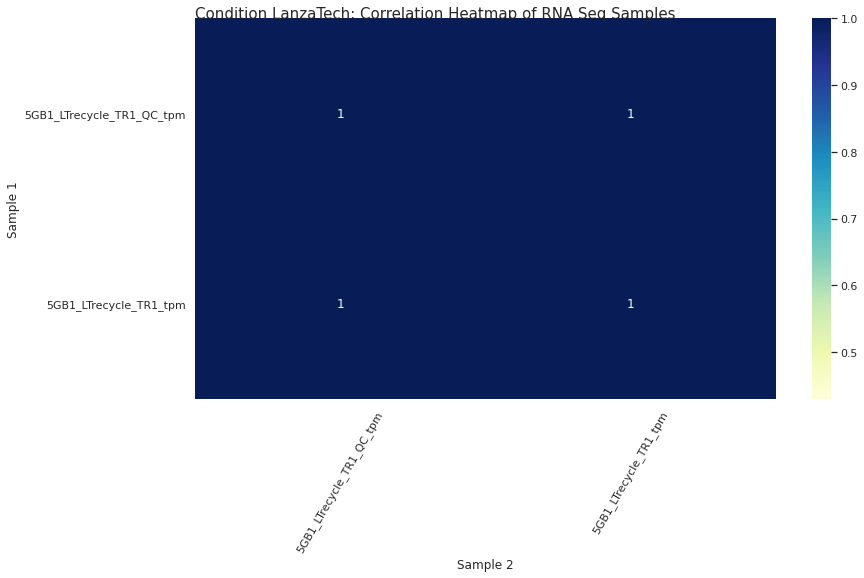

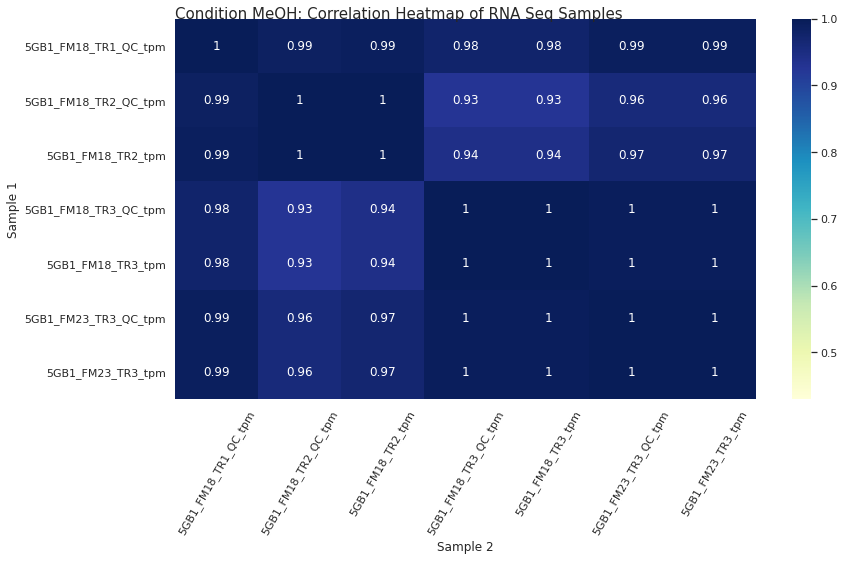

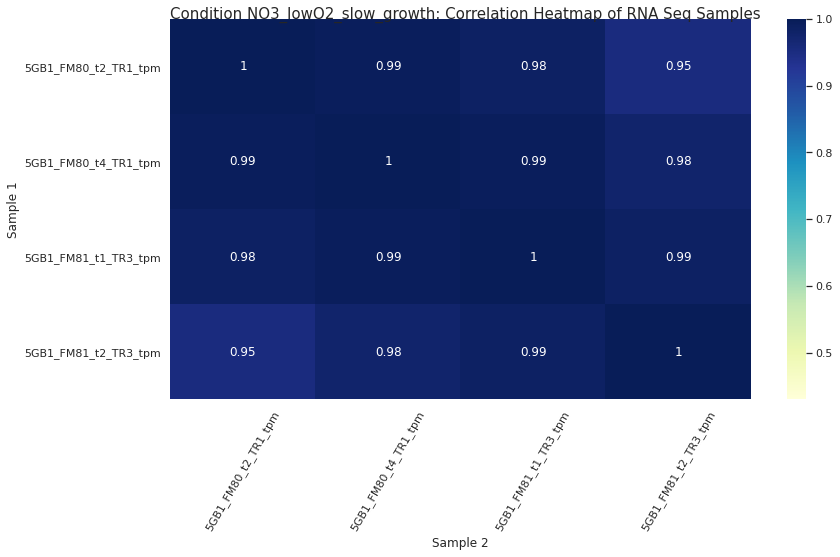

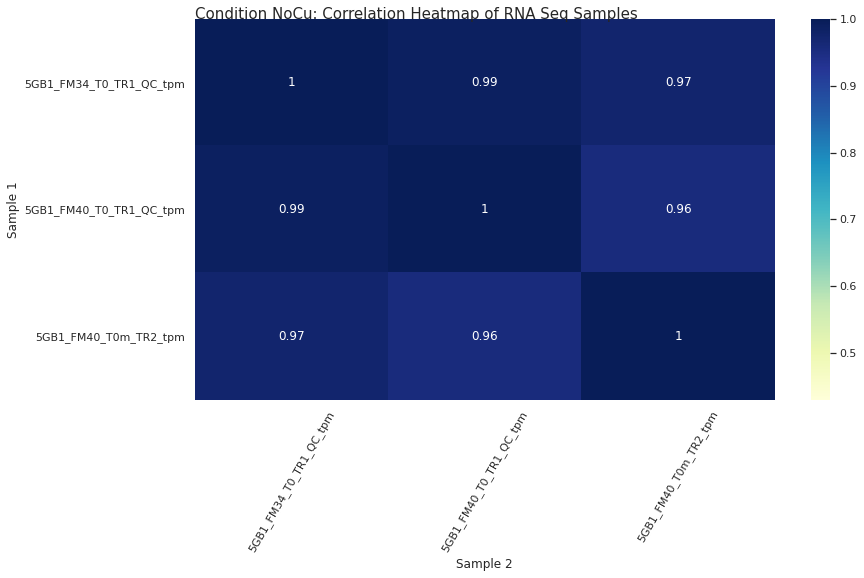

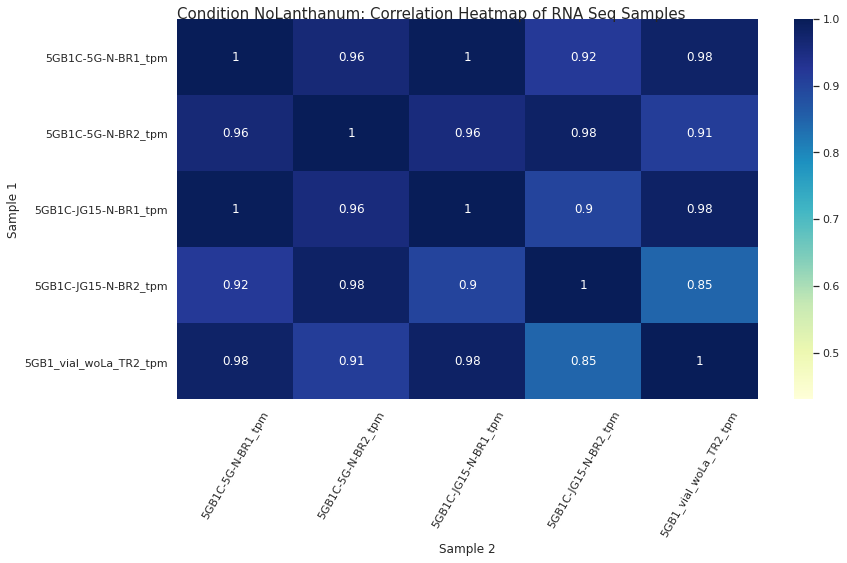

...

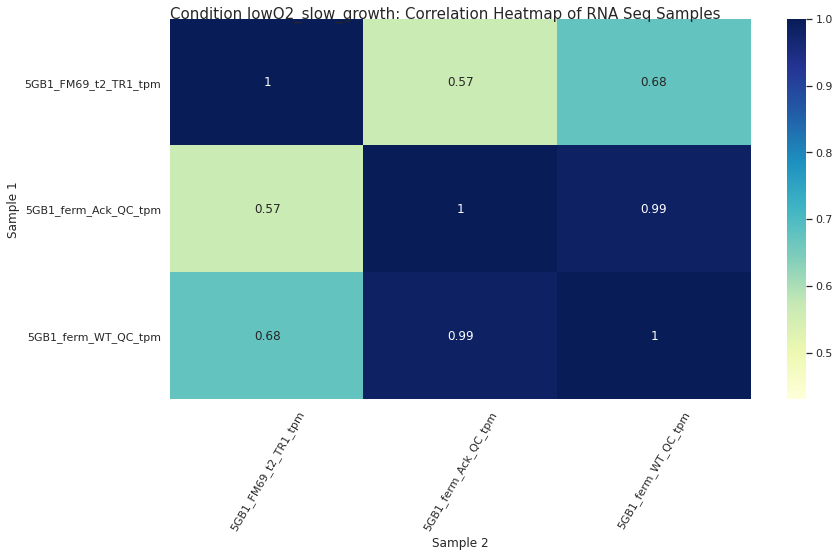

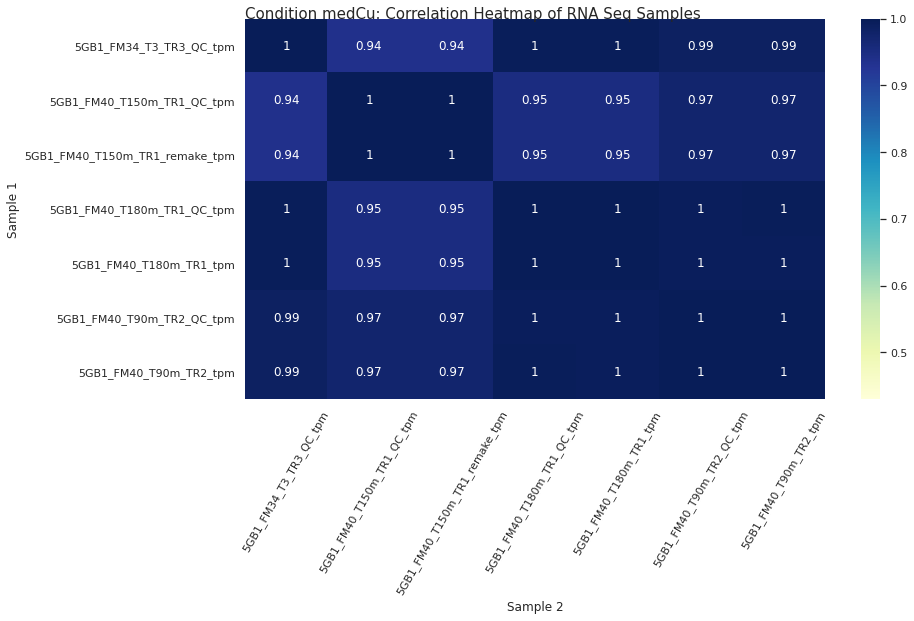

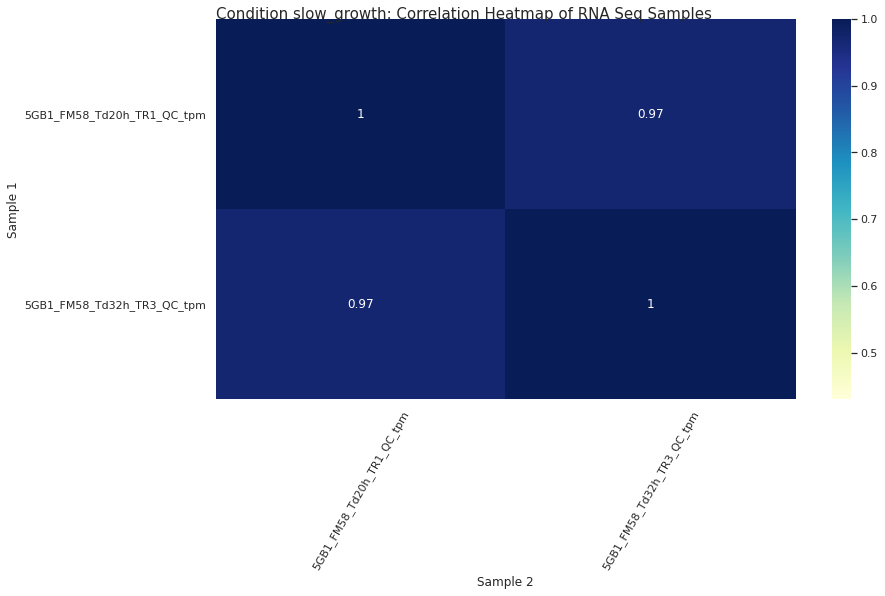

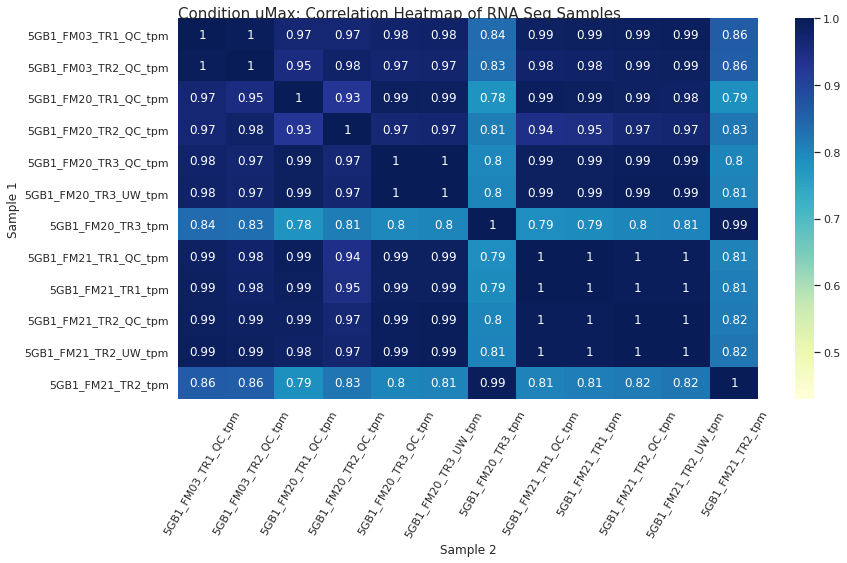

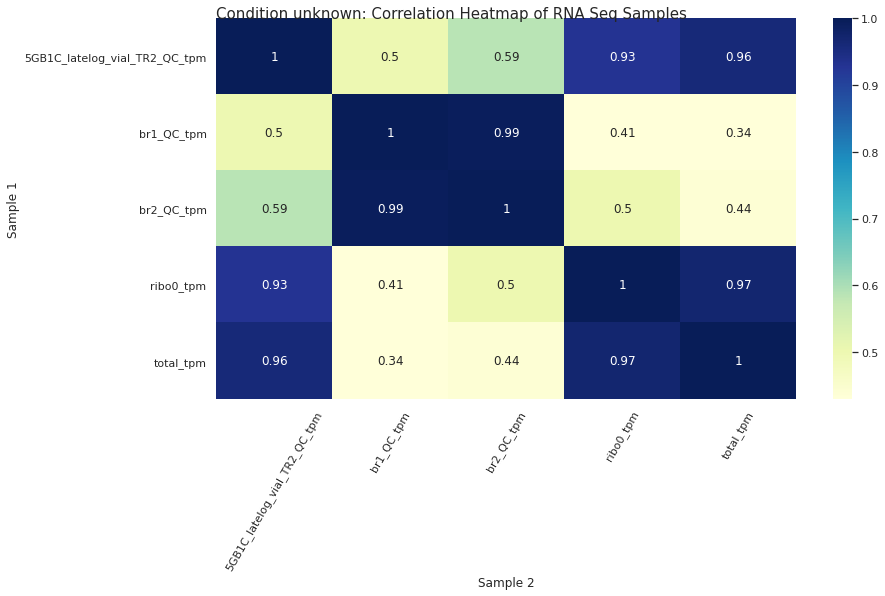

In [83]:


for i, condition in enumerate(list_conditions):
    
    # Filter the dataset of samples (and their correlations) down to selected column
    df_condition_corr = df_sorted_sample_corr[df_sorted_sample_corr["Condition 1"] == condition]
    df_condition_corr = df_condition_corr[df_condition_corr["Condition 2"] == condition]
    
    # Create rectangular matrix that uses samples and correlation values from filtered data
    df_mapped_corr = df_condition_corr.pivot('Sample 1', 'Sample 2', 'Corr Value')
    
    # Plot the heatmap
    plt.figure(i)
    plt.text(0, 0, s = "Condition {}: Correlation Heatmap of RNA Seq Samples".format(condition), fontsize = 15)

    heatmap = sns.heatmap(df_mapped_corr, cmap="YlGnBu", annot = True, vmin=0.4300, vmax = 1.0000) #,  ax=ax[axis_position])
    
    # Adjust heatmap settings for visual pleasing
    heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=60)
    heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)

    
    
    

In [140]:
# OLD HEATMAPS

cur_condition = []
axis_position = 0
for i, condition in enumerate(df_sorted.columns): 
    if condition not in cur_condition: 
        
        #use mapping to obtain the condition
        
        df_condition = df_sample_corr.loc[condition]
        df_condition = df_condition.T.loc[condition]
        
        #plt.figure(i)
        #plt.text(0, 0, s = "Condition {}: Correlation Heatmap of RNA Seq Samples".format(condition), fontsize = 15)
        # alt title: "Correlation Heatmap of RNA Seq Samples In Condition " + r"$\bf{" + condition + "}$"
        
        #sns.heatmap(df_condition, cmap="YlGnBu", annot = True, vmin=0.4300, vmax = 1.0000) #,  ax=ax[axis_position])
        
    cur_condition.append(condition)

<a id = "log_corr"></a>

## <u>Log Samples Data Correlation (for pseudo-counts)</u>

### 1. All Samples on one Heatmap

In [66]:
# implement pseudo-counts to avoid errors with zeros <-- a little bit of values
df_log_sorted = np.log(df_sorted.astype(float))
df_log_sorted


<ipython-input-66-c930a8331f0a>:2: RuntimeWarning: divide by zero encountered in log
  df_log_sorted = np.log(df_sorted.astype(float))


,LanzaTech,LanzaTech,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,NO3_lowO2_slow_growth,...,uMax,uMax,uMax,uMax,uMax,unknown,unknown,unknown,unknown,unknown
0,3.284607,3.200912,3.258240,3.139757,3.073276,3.203709,2.937546,3.285658,3.105833,3.598576,...,3.800025,3.988671,3.857280,3.806797,3.955034,3.856505,3.321813,1.378487,1.480045,2.941412
1,4.099087,3.934540,2.874287,3.114769,3.039757,3.026611,2.727877,2.746074,2.980128,3.955872,...,3.927054,4.058175,4.069554,4.035499,4.006377,3.827854,3.382208,0.974329,1.141777,3.117241
2,2.429686,2.505752,2.741204,3.022004,2.977694,2.929223,2.938327,2.874957,2.896184,3.205024,...,3.423546,3.603547,3.513059,3.511048,3.400523,2.668439,3.066435,0.993569,0.985127,2.993867
3,4.358251,4.325989,2.726015,2.866753,3.069890,3.100144,2.885962,2.706493,2.907707,4.271784,...,4.211365,4.228912,4.208889,4.157446,4.286587,3.568961,3.539450,3.562369,2.941397,3.173658
4,3.681299,3.866543,2.713064,3.031298,2.919165,2.953977,2.736572,2.611837,2.778138,3.787163,...,3.512421,3.839518,3.670401,3.711758,4.138509,4.404954,2.965253,2.464381,1.542986,3.393920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,3.893102,3.760384,3.167856,3.239125,3.574546,3.635486,3.469453,3.049378,3.214143,3.792862,...,4.365773,4.370806,4.457662,4.375226,4.643084,3.546316,3.875683,3.613373,3.066976,2.705181
4209,5.853143,5.886946,4.157899,4.617782,4.778844,4.797530,4.504022,4.091236,4.601841,5.410296,...,6.036652,6.072031,6.074404,5.965559,5.995812,5.583582,5.353474,3.171505,3.014670,3.890829
4210,4.982144,5.129553,4.799018,5.128193,5.305103,5.277172,5.064117,4.811640,5.088664,5.303599,...,6.002791,6.114112,6.109530,6.033241,6.205088,5.425564,5.473813,3.200648,2.831861,4.519891
4211,6.324646,6.371195,5.829948,6.339439,6.388376,6.421499,6.200124,5.821263,6.276688,6.239285,...,7.001853,7.230028,7.218734,7.177491,7.117031,6.616964,6.545243,4.134678,3.658981,5.169473


In [67]:
# Obtain correlation matrix for the log-affected data above: 
df_condition_log_corr = df_log_sorted.corr()
df_condition_log_corr

,LanzaTech,LanzaTech,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,NO3_lowO2_slow_growth,...,uMax,uMax,uMax,uMax,uMax,unknown,unknown,unknown,unknown,unknown
LanzaTech,1.000000,0.992589,0.826453,0.868732,0.866297,0.870173,0.847042,0.825108,0.864385,0.910484,...,0.917391,0.920537,0.926312,0.925158,0.904398,0.857283,0.926799,0.645407,0.655351,0.722209
LanzaTech,0.992589,1.000000,0.831784,0.874765,0.871263,0.874517,0.851210,0.828541,0.871333,0.910039,...,0.917702,0.921787,0.927077,0.926188,0.907755,0.861676,0.928552,0.636518,0.647326,0.726950
MeOH,0.826453,0.831784,1.000000,0.948507,0.947493,0.949623,0.949141,0.994151,0.945480,0.829938,...,0.905333,0.904418,0.911610,0.911921,0.888569,0.837696,0.918330,0.617278,0.636602,0.700653
MeOH,0.868732,0.874765,0.948507,1.000000,0.975654,0.978480,0.970754,0.942822,0.994631,0.861126,...,0.929172,0.932124,0.938419,0.939347,0.930468,0.881317,0.945833,0.575513,0.594394,0.728083
MeOH,0.866297,0.871263,0.947493,0.975654,1.000000,0.995941,0.990423,0.943124,0.972960,0.850872,...,0.930217,0.925926,0.929907,0.930575,0.924392,0.867857,0.942860,0.628036,0.646478,0.694522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unknown,0.857283,0.861676,0.837696,0.881317,0.867857,0.868644,0.857575,0.832542,0.879095,0.875041,...,0.910217,0.908153,0.911037,0.912604,0.904643,1.000000,0.927634,0.547476,0.560252,0.668775
unknown,0.926799,0.928552,0.918330,0.945833,0.942860,0.944162,0.932163,0.913894,0.943567,0.919165,...,0.973630,0.971809,0.975744,0.975556,0.964446,0.927634,1.000000,0.637438,0.654827,0.726118
unknown,0.645407,0.636518,0.617278,0.575513,0.628036,0.624432,0.622770,0.616590,0.576752,0.612610,...,0.658287,0.635591,0.647643,0.647045,0.603528,0.547476,0.637438,1.000000,0.967951,0.430575
unknown,0.655351,0.647326,0.636602,0.594394,0.646478,0.642735,0.640620,0.633919,0.594817,0.624649,...,0.662581,0.641322,0.651587,0.650534,0.613691,0.560252,0.654827,0.967951,1.000000,0.466075


In [68]:
# implement pseudo-counts to avoid errors with zeros <-- a little bit of values
df_log_corr = np.log(df_raw.astype(float)).corr()
df_log_corr

<ipython-input-68-d9aa6ae3d876>:2: RuntimeWarning: divide by zero encountered in log
  df_log_corr = np.log(df_raw.astype(float)).corr()


,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_FM03_TR1_QC_tpm,5GB1_FM03_TR2_QC_tpm,5GB1_FM11_TR1_QC_tpm,5GB1_FM11_TR2_QC_tpm,5GB1_FM12_TR1_tpm,5GB1_FM12_TR1_QC_tpm,5GB1_FM12_TR2_tpm,5GB1_FM12_TR2_QC_tpm,...,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm
5GB1_ferm_Ack_QC_tpm,1.000000,0.941037,0.627686,0.642789,0.673198,0.668333,0.689745,0.689227,0.689791,0.684847,...,0.709856,0.691822,0.750575,0.732389,0.734533,0.697171,0.742985,0.746233,0.737263,0.720092
5GB1_ferm_WT_QC_tpm,0.941037,1.000000,0.699100,0.714502,0.724768,0.725053,0.745291,0.745763,0.743224,0.739415,...,0.771195,0.750990,0.781848,0.768262,0.758624,0.730992,0.758112,0.762998,0.754716,0.745765
5GB1_FM03_TR1_QC_tpm,0.627686,0.699100,1.000000,0.984485,0.953793,0.958245,0.951787,0.950552,0.946379,0.944222,...,0.898016,0.908842,0.734388,0.765624,0.773021,0.840027,0.710967,0.721036,0.753138,0.793226
5GB1_FM03_TR2_QC_tpm,0.642789,0.714502,0.984485,1.000000,0.959362,0.966541,0.962202,0.960683,0.957180,0.954801,...,0.908086,0.917447,0.751163,0.780518,0.788121,0.850999,0.727267,0.737667,0.767311,0.806479
5GB1_FM11_TR1_QC_tpm,0.673198,0.724768,0.953793,0.959362,1.000000,0.987776,0.954488,0.953931,0.950241,0.950178,...,0.906001,0.920240,0.768852,0.796370,0.803980,0.861613,0.748240,0.758524,0.789589,0.822009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5GB1C-5G-N-BR2_tpm,0.697171,0.730992,0.840027,0.850999,0.861613,0.865646,0.880981,0.881624,0.877467,0.878678,...,0.867494,0.863368,0.936494,0.953040,0.973071,1.000000,0.925441,0.939861,0.963416,0.974632
5GB1C-JG15-La-BR1_tpm,0.742985,0.758112,0.710967,0.727267,0.748240,0.753054,0.780609,0.779365,0.774791,0.772087,...,0.790221,0.770077,0.958090,0.938788,0.975770,0.925441,1.000000,0.994402,0.979337,0.960751
5GB1C-JG15-La-BR2_tpm,0.746233,0.762998,0.721036,0.737667,0.758524,0.763868,0.791168,0.790195,0.785829,0.783152,...,0.799841,0.780052,0.963781,0.948087,0.985281,0.939861,0.994402,1.000000,0.987906,0.968266
5GB1C-JG15-N-BR1_tpm,0.737263,0.754716,0.753138,0.767311,0.789589,0.792664,0.818678,0.818240,0.814966,0.814317,...,0.819671,0.804521,0.961583,0.953792,0.991276,0.963416,0.979337,0.987906,1.000000,0.976047


In [69]:
# Reorganize the correlations into more powerful dataframe

# Stack -> reshape the dataframe so that column names get incorporated into the dataframe
# Reset Index -> resets indexes for new names
df_corr_log_values = (df_log_corr
                       .stack()
                       .reset_index())

df_corr_log_values.columns = ['Sample 1','Sample 2','Corr Value']

# Add columns for the condition types for each of the samples present
df_corr_log_values['Condition 1'] = df_corr_log_values['Sample 1'].apply(lambda x: sample2condition.get(x))
df_corr_log_values['Condition 2'] = df_corr_log_values['Sample 2'].apply(lambda x: sample2condition.get(x))

df_corr_log_values

,Sample 1,Sample 2,Corr Value,Condition 1,Condition 2
0,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_Ack_QC_tpm,1.000000,lowO2_slow_growth,lowO2_slow_growth
1,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,0.941037,lowO2_slow_growth,lowO2_slow_growth
2,5GB1_ferm_Ack_QC_tpm,5GB1_FM03_TR1_QC_tpm,0.627686,lowO2_slow_growth,uMax
3,5GB1_ferm_Ack_QC_tpm,5GB1_FM03_TR2_QC_tpm,0.642789,lowO2_slow_growth,uMax
4,5GB1_ferm_Ack_QC_tpm,5GB1_FM11_TR1_QC_tpm,0.673198,lowO2_slow_growth,lowO2_fast_growth
...,...,...,...,...,...
9599,5GB1C-JG15-N-BR2_tpm,5GB1C-5G-N-BR2_tpm,0.974632,NoLanthanum,NoLanthanum
9600,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,0.960751,NoLanthanum,WithLanthanum
9601,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-La-BR2_tpm,0.968266,NoLanthanum,WithLanthanum
9602,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-N-BR1_tpm,0.976047,NoLanthanum,NoLanthanum


In [70]:

#SORT Correlations: 
df_sorted_sample_log_corr = df_corr_log_values.sort_values(["Condition 1"])
df_sorted_sample_log_corr

,Sample 1,Sample 2,Corr Value,Condition 1,Condition 2
7545,5GB1_LTrecycle_TR1_QC_tpm,5GB1C-JG15-N-BR2_tpm,0.837983,LanzaTech,NoLanthanum
7421,5GB1_LTrecycle_TR1_tpm,5GB1_FM80_t2_TR1_tpm,0.910039,LanzaTech,NO3_lowO2_slow_growth
7420,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t4_TR1_UW_tpm,0.901245,LanzaTech,highO2_slow_growth
7419,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t4_TR1_tpm,0.923603,LanzaTech,highO2_slow_growth
7418,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t3_TR1_UW_tpm,0.893767,LanzaTech,highO2_slow_growth
...,...,...,...,...,...
7964,br2_QC_tpm,5GB1_FM20_TR3_tpm,0.653391,unknown,uMax
7963,br2_QC_tpm,5GB1_FM20_TR2_QC_tpm,0.616915,unknown,uMax
7962,br2_QC_tpm,5GB1_FM20_TR1_QC_tpm,0.592228,unknown,uMax
7984,br2_QC_tpm,5GB1_FM34_T7_TR3_QC_tpm,0.616333,unknown,highCu


In [71]:

# Reshapes data frame with new index, columns, AND value
df_rect_sorted_log_corr = df_sorted_sample_log_corr.pivot('Sample 1', 'Sample 2', 'Corr Value')
df_rect_sorted_log_corr

Sample 2,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm,5GB1C_latelog_vial_TR2_QC_tpm,5GB1_FM03_TR1_QC_tpm,...,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1_vial_wLa_TR3_tpm,5GB1_vial_woLa_TR2_tpm,br1_QC_tpm,br2_QC_tpm,ribo0_tpm,total_tpm
Sample 1,,,,,,,,,,,,,,,,,,,,,
5GB1C-5G-La-BR1_tpm,1.000000,0.991077,0.966150,0.936494,0.958090,0.963781,0.961583,0.953026,0.879487,0.734388,...,0.750575,0.781848,0.854868,0.836125,0.903475,0.886384,0.504953,0.475788,0.789558,0.713684
5GB1C-5G-La-BR2_tpm,0.991077,1.000000,0.963262,0.953040,0.938788,0.948087,0.953792,0.959679,0.863787,0.765624,...,0.732389,0.768262,0.875583,0.860834,0.903884,0.886050,0.520577,0.494349,0.814594,0.738478
5GB1C-5G-N-BR1_tpm,0.966150,0.963262,1.000000,0.973071,0.975770,0.985281,0.991276,0.985579,0.840802,0.773021,...,0.734533,0.758624,0.834275,0.818420,0.863410,0.911073,0.550571,0.522897,0.828674,0.753456
5GB1C-5G-N-BR2_tpm,0.936494,0.953040,0.973071,1.000000,0.925441,0.939861,0.963416,0.974632,0.802128,0.840027,...,0.697171,0.730992,0.867494,0.863368,0.847334,0.894751,0.598056,0.578426,0.884212,0.814621
5GB1C-JG15-La-BR1_tpm,0.958090,0.938788,0.975770,0.925441,1.000000,0.994402,0.979337,0.960751,0.855504,0.710967,...,0.742985,0.758112,0.790221,0.770077,0.841225,0.888727,0.505558,0.477189,0.767154,0.697882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5GB1_vial_woLa_TR2_tpm,0.886384,0.886050,0.911073,0.894751,0.888727,0.895799,0.913434,0.906118,0.893026,0.796332,...,0.717319,0.746881,0.836284,0.824438,0.931384,1.000000,0.513408,0.486699,0.844686,0.787295
br1_QC_tpm,0.504953,0.520577,0.550571,0.598056,0.505558,0.520572,0.557112,0.537839,0.466075,0.598513,...,0.453662,0.478167,0.603204,0.612899,0.479131,0.513408,1.000000,0.967951,0.654827,0.560252
br2_QC_tpm,0.475788,0.494349,0.522897,0.578426,0.477189,0.491345,0.530828,0.512763,0.430575,0.589671,...,0.428700,0.451889,0.587400,0.602793,0.455616,0.486699,0.967951,1.000000,0.637438,0.547476


CPU times: user 17.9 s, sys: 2.03 s, total: 19.9 s
Wall time: 19.7 s


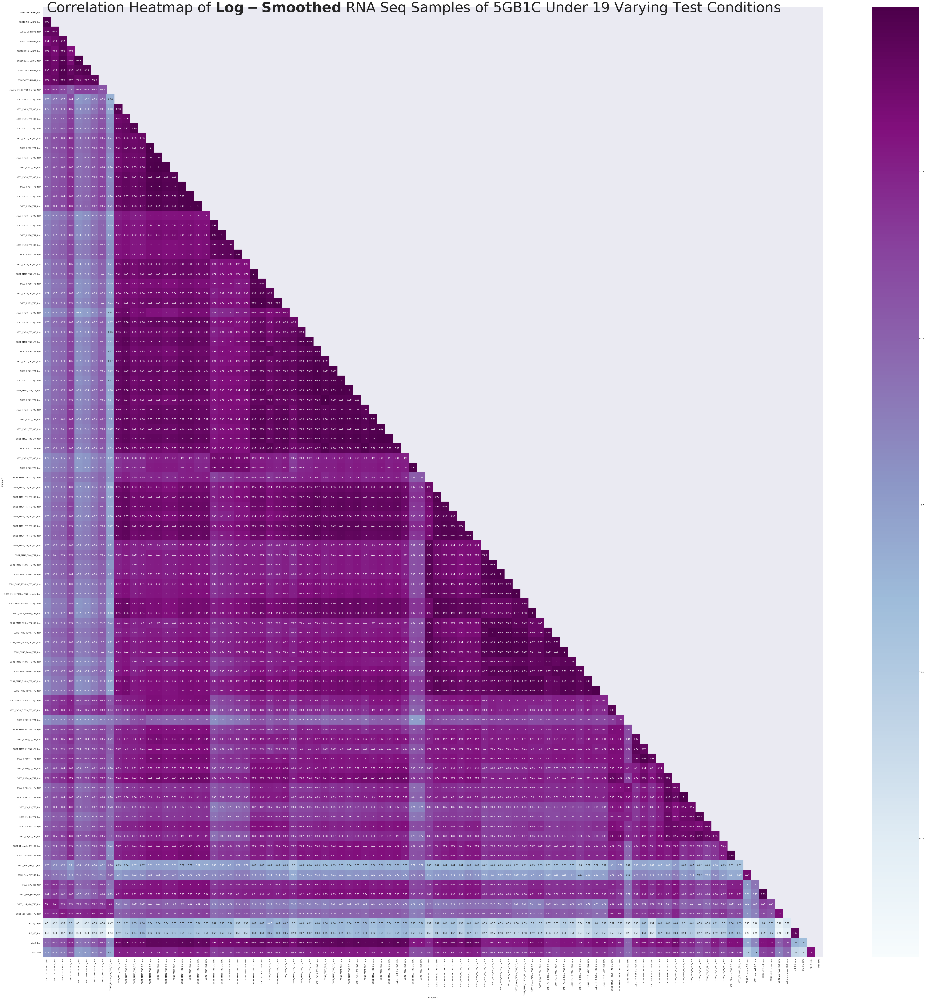

In [63]:
%%time

# Create Mask to Avoid Duplicates -> triangular heatmap for analysis
mask = np.zeros_like(df_rect_sorted_log_corr)
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True

plt.figure(figsize = (100, 100))

sns.heatmap(df_rect_sorted_log_corr, cmap="BuPu", mask = mask, annot = True)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=60)

plt.text(0.5, 0.5, s = "Correlation Heatmap of " + r"$\bf{Log-Smoothed}$" + " RNA Seq Samples of 5GB1C Under 19 Varying Test Conditions", fontsize = 80)
plt.xticks = 30
plt.yticks = 30
#plt.show

plt.savefig("log_sample_corr.png")


### 2. Sorted Sample by Sample Visualization

In [72]:
list_conditions

Index(['LanzaTech', 'MeOH', 'NO3_lowO2_slow_growth', 'NoCu', 'NoLanthanum',
       'WT_control', 'WithLanthanum', 'aa3_KO', 'crotonic_acid', 'highCu',
       'highO2_slow_growth', 'lowCH4', 'lowCu', 'lowO2_fast_growth',
       'lowO2_slow_growth', 'medCu', 'slow_growth', 'uMax', 'unknown'],
      dtype='object', name='exp_condition')

In [73]:
s_2 = df_sorted_sample_log_corr[df_sorted_sample_log_corr["Condition 1"] == "lowO2_slow_growth"]
s_2 = s_2[s_2["Condition 2"] == "lowO2_slow_growth"]
s_2

# Reshapes data frame with new index, columns, AND value
s_2 = s_2.pivot('Sample 1', 'Sample 2', 'Corr Value')
# ---------------index-------column--------value-----

s_2


Sample 2,5GB1_FM69_t2_TR1_tpm,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm
Sample 1,,,
5GB1_FM69_t2_TR1_tpm,1.000000,0.610729,0.654474
5GB1_ferm_Ack_QC_tpm,0.610729,1.000000,0.941037
5GB1_ferm_WT_QC_tpm,0.654474,0.941037,1.000000


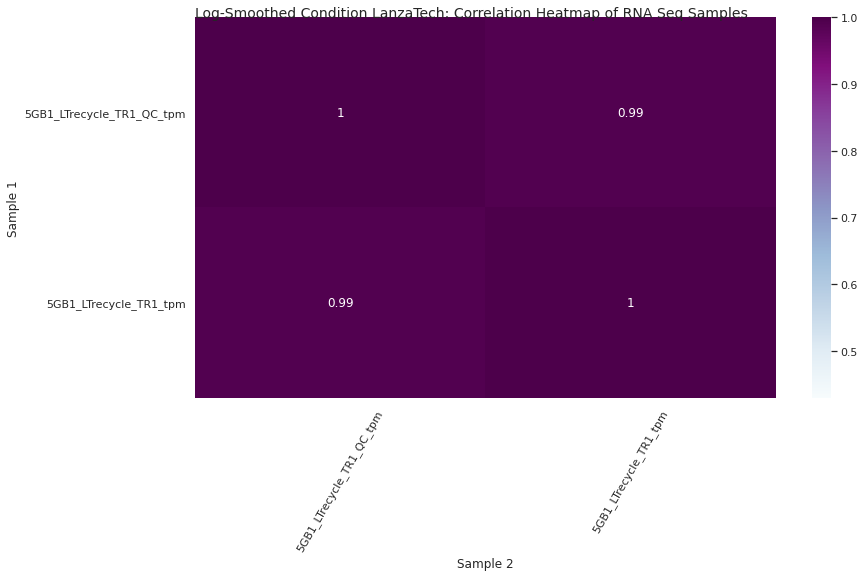

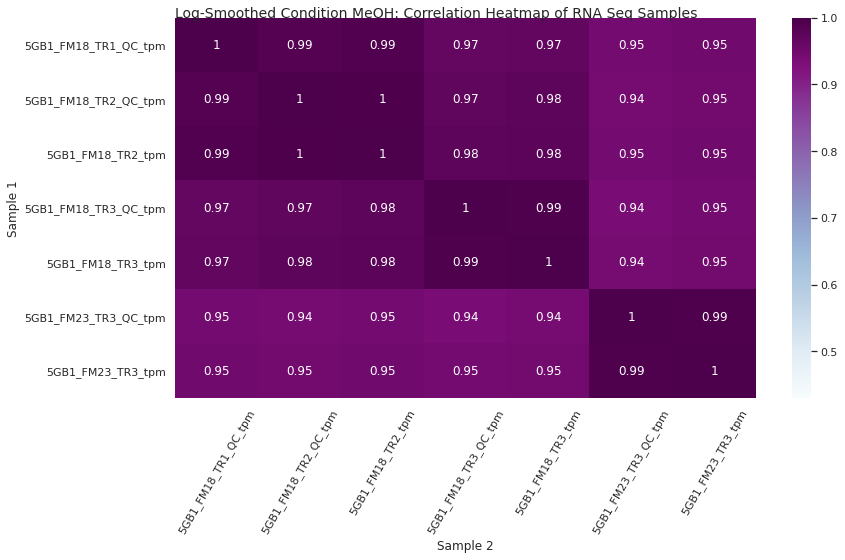

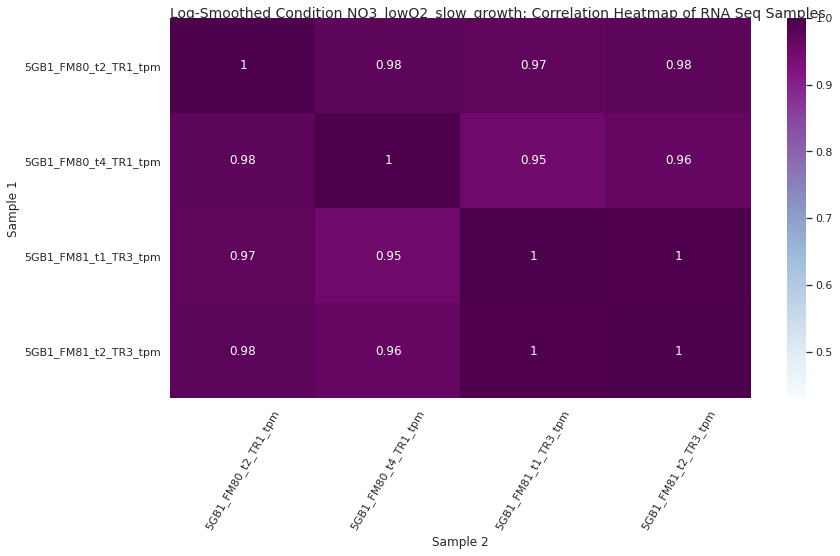

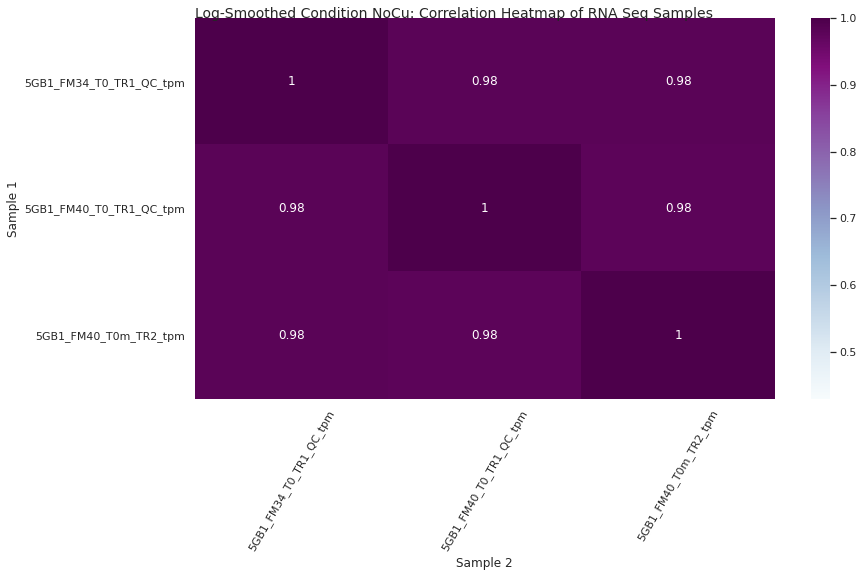

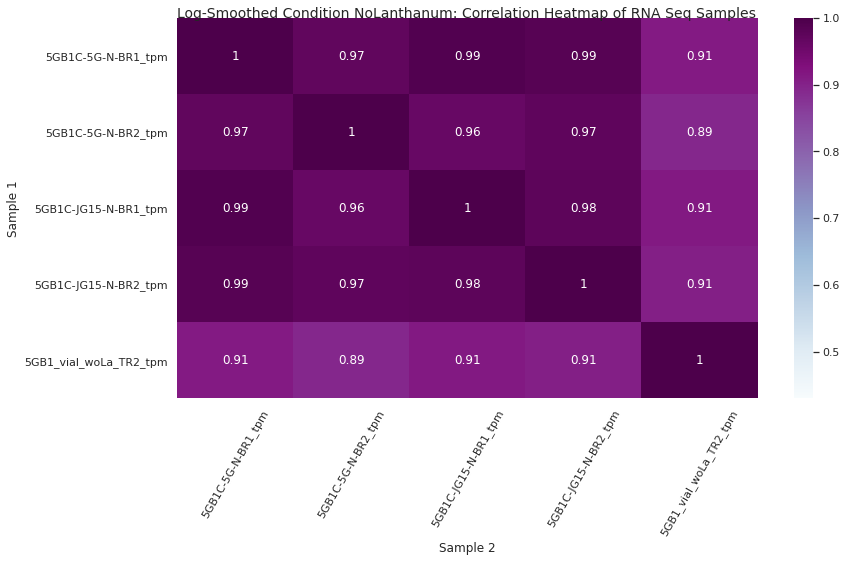

...

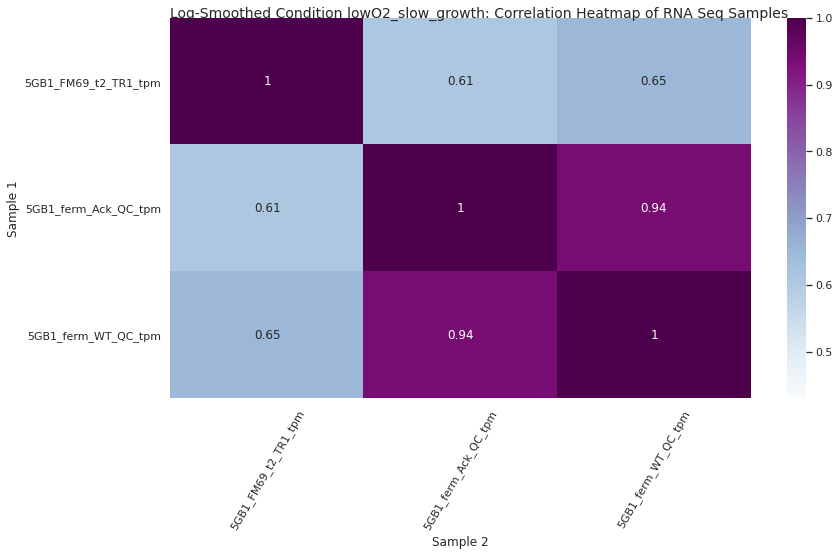

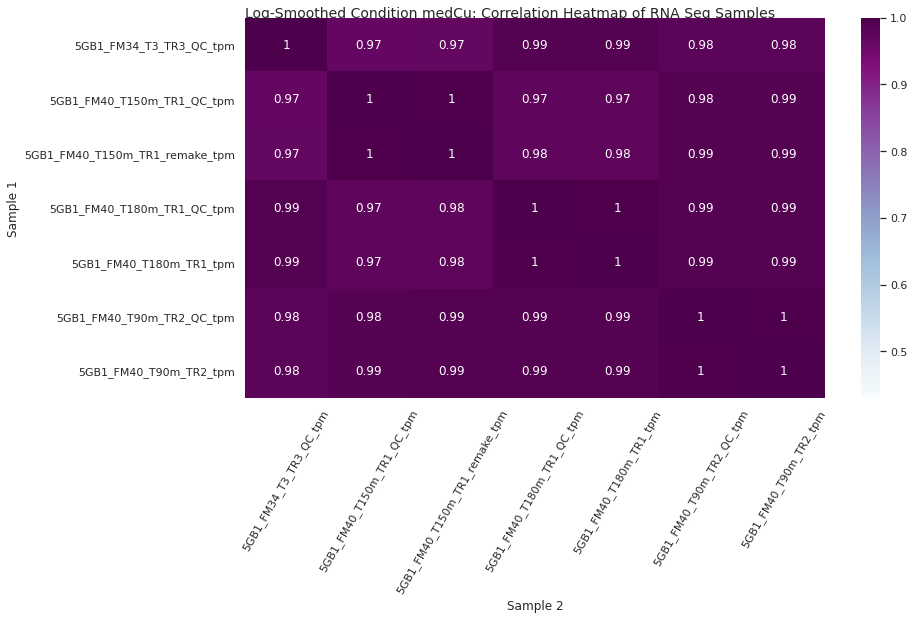

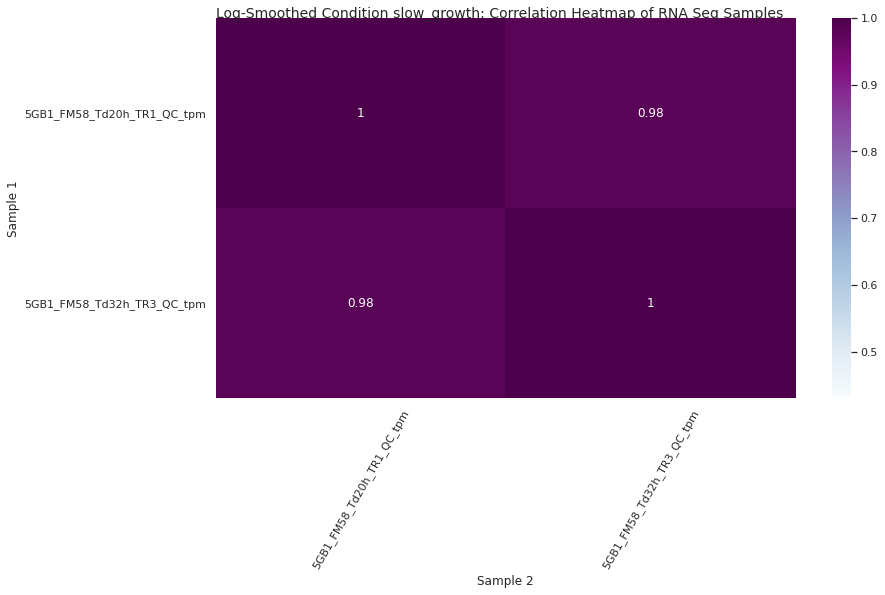

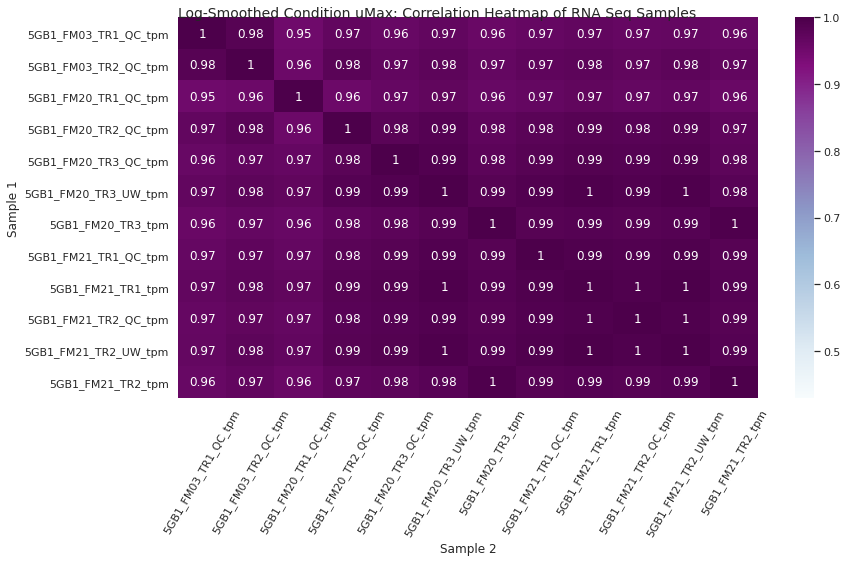

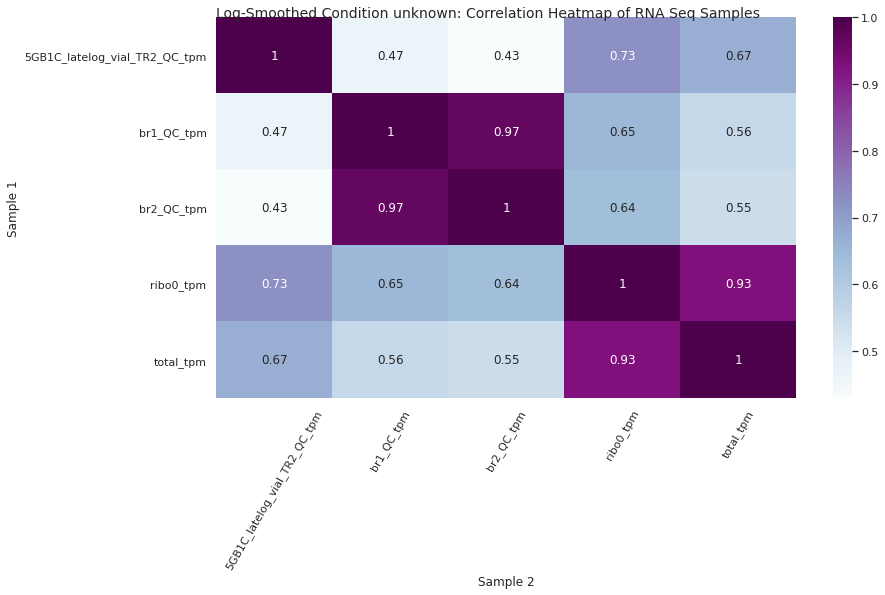

In [121]:

for i, condition in enumerate(list_conditions):
    
    # Filter the dataset of samples (and their correlations) down to selected column
    df_condition_corr = df_sorted_sample_log_corr[df_sorted_sample_log_corr["Condition 1"] == condition]
    df_condition_corr = df_condition_corr[df_condition_corr["Condition 2"] == condition]
    
    # Create rectangular matrix that uses samples and correlation values from filtered data
    df_mapped_corr = df_condition_corr.pivot('Sample 1', 'Sample 2', 'Corr Value')
    
    # Plot the heatmap
    plt.figure(i)
    plt.text(0, 0, s = "Log-Smoothed Condition {}: Correlation Heatmap of RNA Seq Samples".format(condition), fontsize = 14)

    heatmap2 = sns.heatmap(df_mapped_corr, cmap="BuPu", annot = True, vmin = 0.4300, vmax = 1.0000) #,  ax=ax[axis_position])

    # Adjust heatmap settings for visual pleasing
    heatmap2.set_xticklabels(heatmap2.get_xticklabels(), rotation=60)
    heatmap2.set_yticklabels(heatmap2.get_yticklabels(), rotation=0)


In [85]:
# OLD HEATMAPS

cur_condition = []

for i, condition in enumerate(df_sorted.columns): 
    if condition not in cur_condition: 
        df_condition = df_log_corr.loc[condition]
        df_condition = df_condition.T.loc[condition]
        
#         plt.figure(i)
#         plt.text(0, 0, s = "Log-Smoothed Condition {}: Correlation Heatmap of RNA Seq Samples".format(condition), fontsize = 14)
        
#         sns.heatmap(df_condition, cmap="BuPu", annot = True, vmin = 0.4300, vmax = 1.0000) #,  ax=ax[axis_position])
        
    cur_condition.append(condition)

<a id = "scaled_corr"></a>

## <u>Standard Scalar Function Data Correlation (for pseudo-counts)</u>
#### --> Employing sklearn pre-processing scalar function

### 1. All Samples on one Heatmap

In [74]:
# Scalar Function ==> intended to change the distribution of the data at hand
# - Normalization: Scale down units so the magnitudes are at max = 1
# - Standardization: Standard Normal Distribution (mean = 0, std dev = 1)

# Intention: Use sklearn's standard scalar function to output scaled values of TPM values
from sklearn.preprocessing import StandardScaler

scaling = StandardScaler()

table_standard_scaled = scaling.fit_transform(df_sorted)
df_standard_scaled_old = pd.DataFrame(table_standard_scaled, index=df_sorted.index, columns=df_sorted.columns)
df_standard_scaled_old


,LanzaTech,LanzaTech,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,NO3_lowO2_slow_growth,...,uMax,uMax,uMax,uMax,uMax,unknown,unknown,unknown,unknown,unknown
0,-0.058115,-0.059191,-0.022259,-0.022539,-0.029021,-0.028579,-0.025948,-0.022054,-0.022438,-0.066793,...,-0.060022,-0.055443,-0.057603,-0.051546,-0.053205,-0.034176,-0.041553,-0.028215,-0.024895,-0.044810
1,-0.048849,-0.051797,-0.023132,-0.022599,-0.029117,-0.029116,-0.026371,-0.023221,-0.022713,-0.061572,...,-0.058135,-0.054268,-0.054209,-0.048447,-0.052414,-0.034417,-0.041211,-0.028374,-0.025030,-0.044063
2,-0.062347,-0.062613,-0.023364,-0.022808,-0.029286,-0.029374,-0.025946,-0.022996,-0.022879,-0.070747,...,-0.064391,-0.060660,-0.061782,-0.054634,-0.059589,-0.040089,-0.042791,-0.028368,-0.025079,-0.044601
3,-0.043929,-0.044982,-0.023389,-0.023119,-0.029031,-0.028905,-0.026060,-0.023284,-0.022857,-0.055117,...,-0.052935,-0.051011,-0.051557,-0.046481,-0.047308,-0.036302,-0.040218,-0.024433,-0.023340,-0.043794
4,-0.054529,-0.052732,-0.023409,-0.022788,-0.029436,-0.029311,-0.026356,-0.023426,-0.023089,-0.064270,...,-0.063503,-0.057704,-0.060049,-0.052640,-0.050184,-0.027963,-0.043200,-0.027273,-0.024865,-0.042586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,-0.051945,-0.054071,-0.022495,-0.022285,-0.027129,-0.026793,-0.024374,-0.022643,-0.022171,-0.064186,...,-0.049427,-0.047847,-0.045796,-0.042314,-0.038359,-0.036445,-0.037489,-0.024211,-0.023070,-0.045628
4209,0.030612,0.034196,-0.018264,-0.014316,-0.015926,-0.015604,-0.017455,-0.018589,-0.014368,-0.004544,...,0.056430,0.059320,0.059787,0.040842,0.047233,0.005154,-0.005157,-0.025812,-0.023187,-0.038653
4210,-0.025262,-0.019031,-0.012213,-0.007221,-0.004842,-0.005581,-0.009396,-0.011981,-0.007846,-0.012074,...,0.052089,0.064953,0.064497,0.048156,0.074105,-0.001838,0.000200,-0.025727,-0.023551,-0.029857
4211,0.088498,0.096627,0.010845,0.034620,0.048092,0.050723,0.030337,0.010474,0.030747,0.091511,...,0.268335,0.345548,0.341752,0.287338,0.286024,0.091763,0.090889,-0.021143,-0.021216,-0.012625


In [75]:
df_scaled_corr_old = df_standard_scaled_old.corr()
df_scaled_corr_old

,LanzaTech,LanzaTech,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,MeOH,NO3_lowO2_slow_growth,...,uMax,uMax,uMax,uMax,uMax,unknown,unknown,unknown,unknown,unknown
LanzaTech,1.000000,0.998307,0.799337,0.804266,0.764292,0.776732,0.790444,0.798993,0.803712,0.891513,...,0.742792,0.935165,0.930765,0.924664,0.891243,0.884326,0.850580,0.426677,0.345823,0.939124
LanzaTech,0.998307,1.000000,0.799088,0.803625,0.765742,0.778035,0.790911,0.798725,0.803053,0.889363,...,0.744156,0.936355,0.932033,0.925435,0.894343,0.883803,0.851649,0.430436,0.350036,0.940861
MeOH,0.799337,0.799088,1.000000,0.995292,0.958387,0.969591,0.991815,0.999998,0.995207,0.772357,...,0.766900,0.941787,0.941845,0.960370,0.932755,0.954851,0.902946,0.576433,0.481113,0.941889
MeOH,0.804266,0.803625,0.995292,1.000000,0.927593,0.942643,0.975885,0.995444,0.999999,0.775795,...,0.744267,0.931556,0.929771,0.954262,0.909701,0.965565,0.903848,0.495330,0.394689,0.934674
MeOH,0.764292,0.765742,0.958387,0.927593,1.000000,0.999079,0.986658,0.957871,0.927194,0.768692,...,0.838842,0.932942,0.938211,0.936851,0.963587,0.891484,0.885437,0.778915,0.703799,0.925257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unknown,0.884326,0.883803,0.954851,0.965565,0.891484,0.906915,0.939227,0.954859,0.965362,0.902544,...,0.840158,0.946591,0.943250,0.962701,0.921349,1.000000,0.973270,0.439665,0.339289,0.960102
unknown,0.850580,0.851649,0.902946,0.903848,0.885437,0.894305,0.909581,0.902654,0.903433,0.952492,...,0.936849,0.913574,0.912548,0.923096,0.913095,0.973270,1.000000,0.501303,0.411699,0.930715
unknown,0.426677,0.430436,0.576433,0.495330,0.778915,0.752292,0.669200,0.575053,0.494483,0.427232,...,0.634238,0.616408,0.631803,0.587947,0.720210,0.439665,0.501303,1.000000,0.993583,0.587734
unknown,0.345823,0.350036,0.481113,0.394689,0.703799,0.673724,0.581591,0.479634,0.393793,0.348095,...,0.571874,0.531086,0.547598,0.498099,0.643699,0.339289,0.411699,0.993583,1.000000,0.500620


In [76]:
# Intention: Use sklearn's standard scalar function to output scaled values of TPM values

from sklearn.preprocessing import StandardScaler

scaling = StandardScaler()

table_standard_scaled = scaling.fit_transform(df_raw)
df_standard_scaled = pd.DataFrame(table_standard_scaled, index=df_sorted.index, columns= df_raw.columns)
df_standard_scaled


,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_FM03_TR1_QC_tpm,5GB1_FM03_TR2_QC_tpm,5GB1_FM11_TR1_QC_tpm,5GB1_FM11_TR2_QC_tpm,5GB1_FM12_TR1_tpm,5GB1_FM12_TR1_QC_tpm,5GB1_FM12_TR2_tpm,5GB1_FM12_TR2_QC_tpm,...,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm
0,-0.022822,-0.024095,-0.053279,-0.053205,-0.043901,-0.051028,-0.044245,-0.044109,-0.045185,-0.045064,...,-0.056429,-0.053114,-0.050072,-0.061044,-0.063257,-0.067378,-0.062250,-0.061300,-0.062224,-0.078089
1,-0.022951,-0.024318,-0.052586,-0.052414,-0.041522,-0.049726,-0.044443,-0.044069,-0.045613,-0.045639,...,-0.052457,-0.049462,-0.048762,-0.058268,-0.061109,-0.062517,-0.060489,-0.058792,-0.060150,-0.073448
2,-0.022969,-0.024458,-0.057507,-0.059589,-0.044738,-0.052807,-0.046733,-0.046832,-0.047757,-0.047777,...,-0.058475,-0.054157,-0.054071,-0.066012,-0.069006,-0.071153,-0.067678,-0.066106,-0.065481,-0.082634
3,-0.022796,-0.024276,-0.048836,-0.047308,-0.038241,-0.045818,-0.042452,-0.042432,-0.043231,-0.043685,...,-0.046128,-0.041868,-0.045685,-0.053406,-0.056987,-0.057064,-0.053033,-0.052894,-0.054010,-0.067315
4,-0.022959,-0.024328,-0.045948,-0.050184,-0.039628,-0.045214,-0.044434,-0.043703,-0.045537,-0.045716,...,-0.053089,-0.050295,-0.050800,-0.062198,-0.063998,-0.065420,-0.062530,-0.062065,-0.058855,-0.078495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,-0.022883,-0.024388,-0.037557,-0.038359,-0.033006,-0.044787,-0.037787,-0.038036,-0.036986,-0.036453,...,-0.047244,-0.038873,-0.054268,-0.065456,-0.069461,-0.068258,-0.067854,-0.067030,-0.065295,-0.084754
4209,-0.022595,-0.023419,0.040229,0.047233,-0.006072,-0.006690,-0.006900,-0.006884,-0.005641,-0.004076,...,0.025952,0.044313,-0.033005,-0.030640,-0.043840,-0.023544,-0.044506,-0.044305,-0.044338,-0.042410
4210,-0.022193,-0.022529,0.074272,0.074105,0.004699,0.023694,0.013421,0.015158,0.016284,0.017395,...,0.018121,0.024756,-0.042119,-0.050145,-0.056086,-0.058757,-0.059803,-0.054427,-0.054566,-0.068068
4211,-0.020999,-0.020322,0.269709,0.286024,0.089049,0.157014,0.125084,0.122856,0.123988,0.129666,...,0.088868,0.118249,-0.008822,-0.013077,-0.007173,0.007423,-0.032331,-0.023749,-0.018976,-0.029162


In [77]:

df_scaled_corr = df_standard_scaled.corr()
df_scaled_corr

,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_FM03_TR1_QC_tpm,5GB1_FM03_TR2_QC_tpm,5GB1_FM11_TR1_QC_tpm,5GB1_FM11_TR2_QC_tpm,5GB1_FM12_TR1_tpm,5GB1_FM12_TR1_QC_tpm,5GB1_FM12_TR2_tpm,5GB1_FM12_TR2_QC_tpm,...,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm
5GB1_ferm_Ack_QC_tpm,1.000000,0.986283,0.811274,0.845524,0.773777,0.768763,0.874834,0.868194,0.904491,0.897596,...,0.694190,0.759531,0.657142,0.591464,0.612449,0.585233,0.643626,0.640767,0.659000,0.493933
5GB1_ferm_WT_QC_tpm,0.986283,1.000000,0.886889,0.910163,0.861308,0.852366,0.923027,0.918322,0.936427,0.931941,...,0.793050,0.851175,0.756407,0.673150,0.706362,0.656180,0.739698,0.739079,0.750428,0.557032
5GB1_FM03_TR1_QC_tpm,0.811274,0.886889,1.000000,0.997201,0.994070,0.995755,0.977174,0.978683,0.953975,0.957162,...,0.965826,0.988351,0.956743,0.891510,0.936733,0.871797,0.949277,0.953341,0.955460,0.790309
5GB1_FM03_TR2_QC_tpm,0.845524,0.910163,0.997201,1.000000,0.985321,0.989408,0.987447,0.988063,0.971563,0.973662,...,0.950386,0.977277,0.940924,0.881958,0.923960,0.867320,0.935198,0.938555,0.944297,0.786921
5GB1_FM11_TR1_QC_tpm,0.773777,0.861308,0.994070,0.985321,1.000000,0.996650,0.961426,0.963933,0.929163,0.933522,...,0.971332,0.995347,0.972992,0.896769,0.945332,0.868190,0.960826,0.965749,0.963052,0.780788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5GB1C-5G-N-BR2_tpm,0.585233,0.656180,0.871797,0.867320,0.868190,0.893341,0.887806,0.892486,0.866849,0.874151,...,0.844104,0.839807,0.927682,0.983657,0.963767,1.000000,0.949791,0.942624,0.955559,0.983839
5GB1C-JG15-La-BR1_tpm,0.643626,0.739698,0.949277,0.935198,0.960826,0.966901,0.921814,0.926631,0.883644,0.890850,...,0.932485,0.944690,0.987608,0.959311,0.991755,0.949791,1.000000,0.998661,0.996946,0.893326
5GB1C-JG15-La-BR2_tpm,0.640767,0.739079,0.953341,0.938555,0.965749,0.972107,0.920729,0.925582,0.881054,0.888269,...,0.941958,0.952443,0.988848,0.954109,0.994087,0.942624,0.998661,1.000000,0.997930,0.883953
5GB1C-JG15-N-BR1_tpm,0.659000,0.750428,0.955460,0.944297,0.963052,0.972969,0.932406,0.936809,0.897791,0.904486,...,0.937155,0.947293,0.984258,0.960142,0.996616,0.955559,0.996946,0.997930,1.000000,0.901057


In [78]:
# Reorganize the correlations into more powerful dataframe

# Stack -> reshape the dataframe so that column names get incorporated into the dataframe
# Reset Index -> resets indexes for new names
df_corr_scaled_values = (df_scaled_corr
                       .stack()
                       .reset_index())

df_corr_scaled_values.columns = ['Sample 1','Sample 2','Corr Value']

# Add columns for the condition types for each of the samples present
df_corr_scaled_values['Condition 1'] = df_corr_scaled_values['Sample 1'].apply(lambda x: sample2condition.get(x))
df_corr_scaled_values['Condition 2'] = df_corr_scaled_values['Sample 2'].apply(lambda x: sample2condition.get(x))

df_corr_scaled_values

,Sample 1,Sample 2,Corr Value,Condition 1,Condition 2
0,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_Ack_QC_tpm,1.000000,lowO2_slow_growth,lowO2_slow_growth
1,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,0.986283,lowO2_slow_growth,lowO2_slow_growth
2,5GB1_ferm_Ack_QC_tpm,5GB1_FM03_TR1_QC_tpm,0.811274,lowO2_slow_growth,uMax
3,5GB1_ferm_Ack_QC_tpm,5GB1_FM03_TR2_QC_tpm,0.845524,lowO2_slow_growth,uMax
4,5GB1_ferm_Ack_QC_tpm,5GB1_FM11_TR1_QC_tpm,0.773777,lowO2_slow_growth,lowO2_fast_growth
...,...,...,...,...,...
9599,5GB1C-JG15-N-BR2_tpm,5GB1C-5G-N-BR2_tpm,0.983839,NoLanthanum,NoLanthanum
9600,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,0.893326,NoLanthanum,WithLanthanum
9601,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-La-BR2_tpm,0.883953,NoLanthanum,WithLanthanum
9602,5GB1C-JG15-N-BR2_tpm,5GB1C-JG15-N-BR1_tpm,0.901057,NoLanthanum,NoLanthanum


In [79]:

#SORT Correlations: 
df_sorted_sample_scaled_corr = df_corr_scaled_values.sort_values(["Condition 1"])
df_sorted_sample_scaled_corr

,Sample 1,Sample 2,Corr Value,Condition 1,Condition 2
7545,5GB1_LTrecycle_TR1_QC_tpm,5GB1C-JG15-N-BR2_tpm,0.874429,LanzaTech,NoLanthanum
7421,5GB1_LTrecycle_TR1_tpm,5GB1_FM80_t2_TR1_tpm,0.889363,LanzaTech,NO3_lowO2_slow_growth
7420,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t4_TR1_UW_tpm,0.879914,LanzaTech,highO2_slow_growth
7419,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t4_TR1_tpm,0.825712,LanzaTech,highO2_slow_growth
7418,5GB1_LTrecycle_TR1_tpm,5GB1_FM69_t3_TR1_UW_tpm,0.878604,LanzaTech,highO2_slow_growth
...,...,...,...,...,...
7964,br2_QC_tpm,5GB1_FM20_TR3_tpm,0.576806,unknown,uMax
7963,br2_QC_tpm,5GB1_FM20_TR2_QC_tpm,0.730854,unknown,uMax
7962,br2_QC_tpm,5GB1_FM20_TR1_QC_tpm,0.483279,unknown,uMax
7984,br2_QC_tpm,5GB1_FM34_T7_TR3_QC_tpm,0.676547,unknown,highCu


In [80]:

# Reshapes data frame with new index, columns, AND value
df_rect_sorted_scaled_corr = df_sorted_sample_scaled_corr.pivot('Sample 1', 'Sample 2', 'Corr Value')
df_rect_sorted_scaled_corr

Sample 2,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm,5GB1C_latelog_vial_TR2_QC_tpm,5GB1_FM03_TR1_QC_tpm,...,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1_vial_wLa_TR3_tpm,5GB1_vial_woLa_TR2_tpm,br1_QC_tpm,br2_QC_tpm,ribo0_tpm,total_tpm
Sample 1,,,,,,,,,,,,,,,,,,,,,
5GB1C-5G-La-BR1_tpm,1.000000,0.961742,0.979030,0.927682,0.987608,0.988848,0.984258,0.859553,0.980016,0.956743,...,0.657142,0.756407,0.947834,0.963776,0.990261,0.989956,0.397717,0.489319,0.915677,0.960720
5GB1C-5G-La-BR2_tpm,0.961742,1.000000,0.967462,0.983657,0.959311,0.954109,0.960142,0.954852,0.921175,0.891510,...,0.591464,0.673150,0.879556,0.877275,0.929020,0.940364,0.382190,0.458059,0.844229,0.869845
5GB1C-5G-N-BR1_tpm,0.979030,0.967462,1.000000,0.963767,0.991755,0.994087,0.996616,0.917882,0.962401,0.936733,...,0.612449,0.706362,0.928267,0.930613,0.963929,0.981890,0.373696,0.460389,0.888196,0.927503
5GB1C-5G-N-BR2_tpm,0.927682,0.983657,0.963767,1.000000,0.949791,0.942624,0.955559,0.983839,0.889882,0.871797,...,0.585233,0.656180,0.844104,0.839807,0.887771,0.912174,0.402954,0.472455,0.810224,0.827863
5GB1C-JG15-La-BR1_tpm,0.987608,0.959311,0.991755,0.949791,1.000000,0.998661,0.996946,0.893326,0.965972,0.949277,...,0.643626,0.739698,0.932485,0.944690,0.974274,0.984820,0.395642,0.485216,0.904454,0.944947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5GB1_vial_woLa_TR2_tpm,0.989956,0.940364,0.981890,0.912174,0.984820,0.990082,0.983422,0.846891,0.973874,0.944392,...,0.595816,0.706707,0.953365,0.958204,0.995050,1.000000,0.319652,0.416346,0.923862,0.972881
br1_QC_tpm,0.397717,0.382190,0.373696,0.402954,0.395642,0.387972,0.419998,0.343741,0.500620,0.590104,...,0.938673,0.870227,0.444283,0.507464,0.323239,0.319652,1.000000,0.993583,0.411699,0.339289
br2_QC_tpm,0.489319,0.458059,0.460389,0.472455,0.485216,0.478958,0.507179,0.402807,0.587734,0.672227,...,0.971132,0.919798,0.533549,0.597712,0.421787,0.416346,0.993583,1.000000,0.501303,0.439665


CPU times: user 16.9 s, sys: 2.02 s, total: 19 s
Wall time: 18.7 s


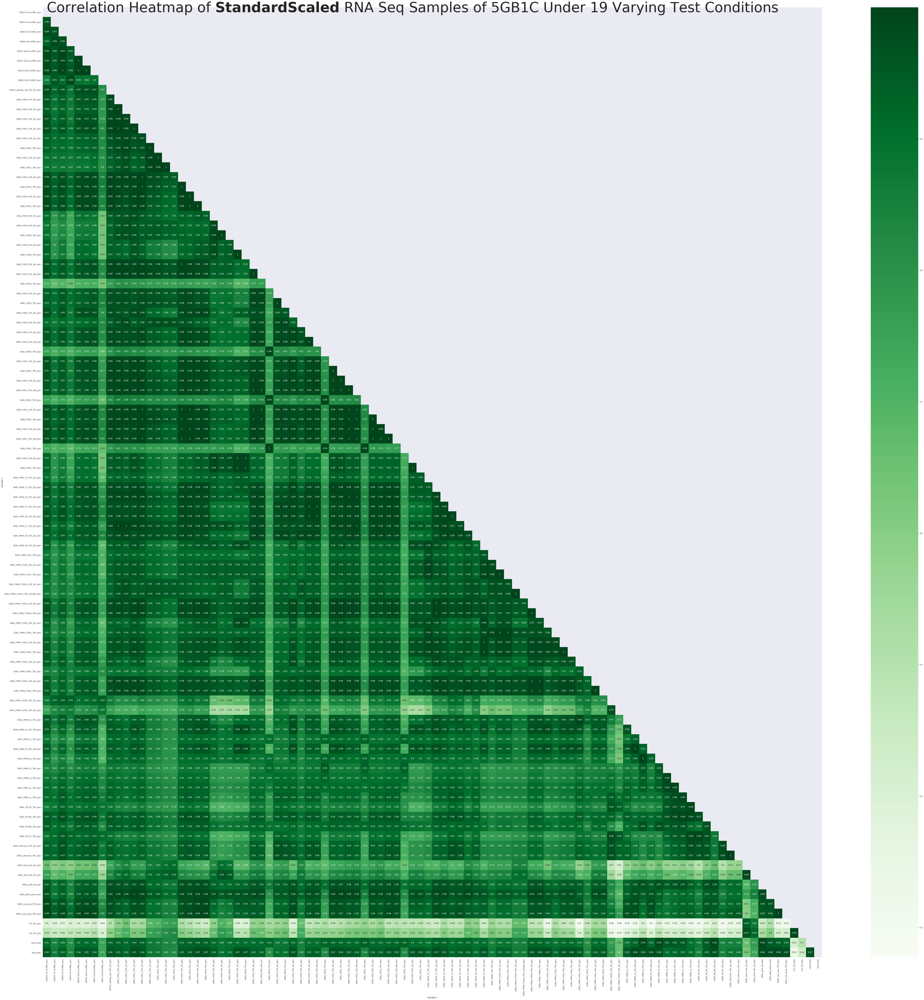

In [40]:
%%time


# Create Mask to Avoid Duplicates -> triangular heatmap for analysis
mask = np.zeros_like(df_rect_sorted_scaled_corr)
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True


plt.figure(figsize = (100, 100))
sns.heatmap(df_rect_sorted_scaled_corr, cmap="Greens", mask = mask, annot = True)
plt.text(0.5, 0.5, s = "Correlation Heatmap of " + r"$\bf{Standard Scaled}$" + " RNA Seq Samples of 5GB1C Under 19 Varying Test Conditions", fontsize = 80)
plt.xticks = 30
plt.yticks = 30
#plt.show()
plt.savefig("scaled_sample_corr.png")

### 2. Sorted Sample by Sample Visualization

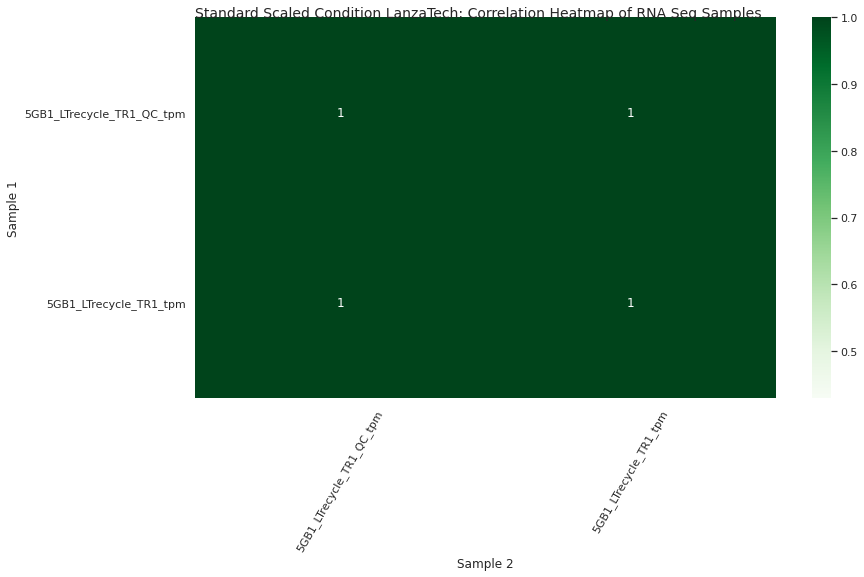

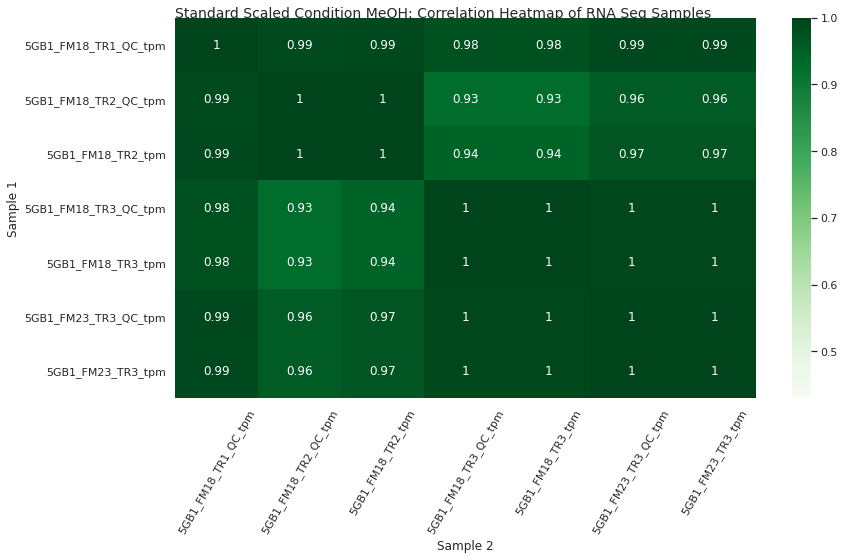

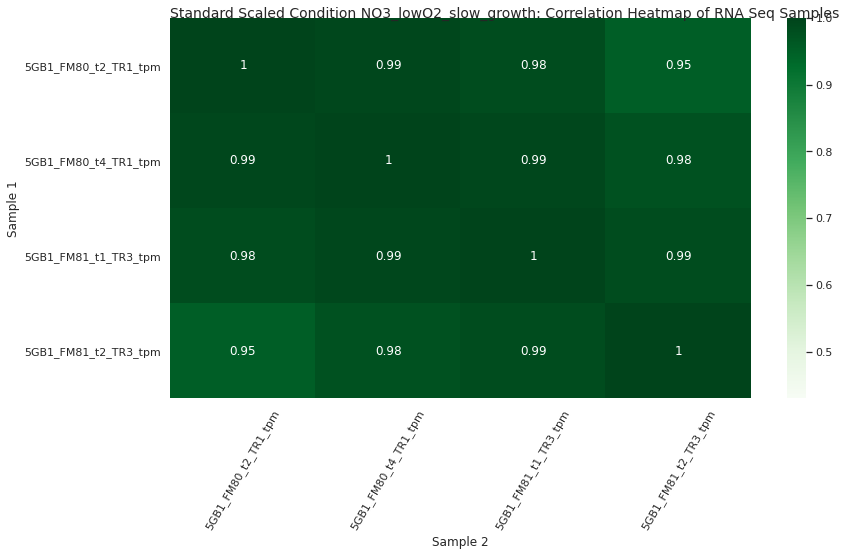

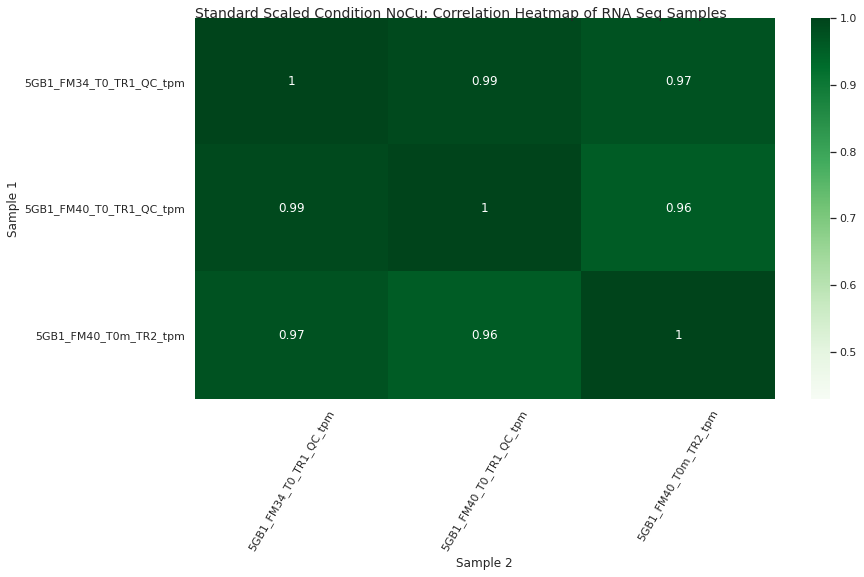

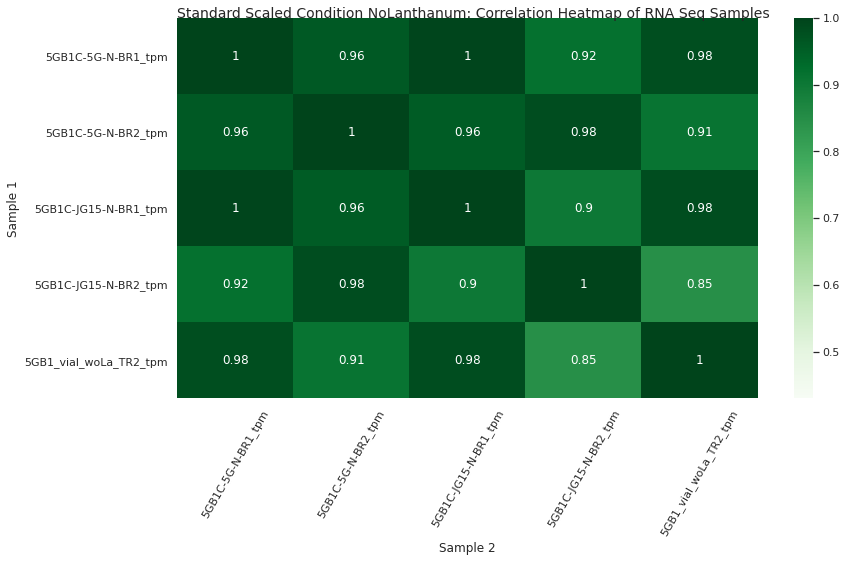

...

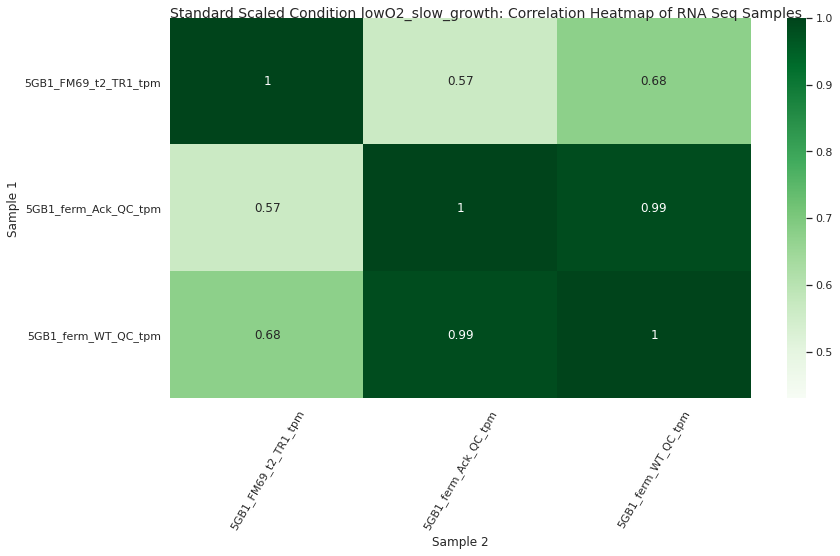

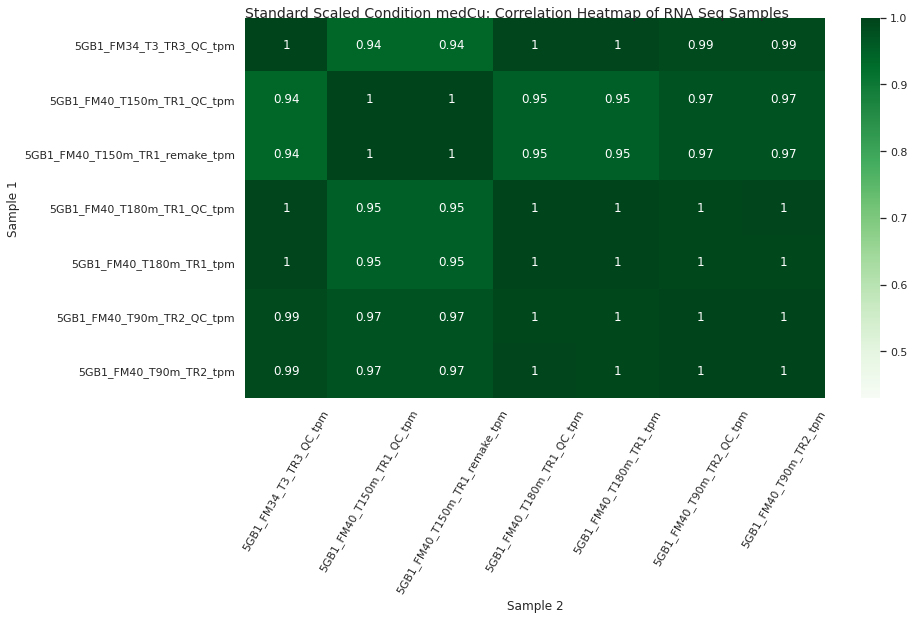

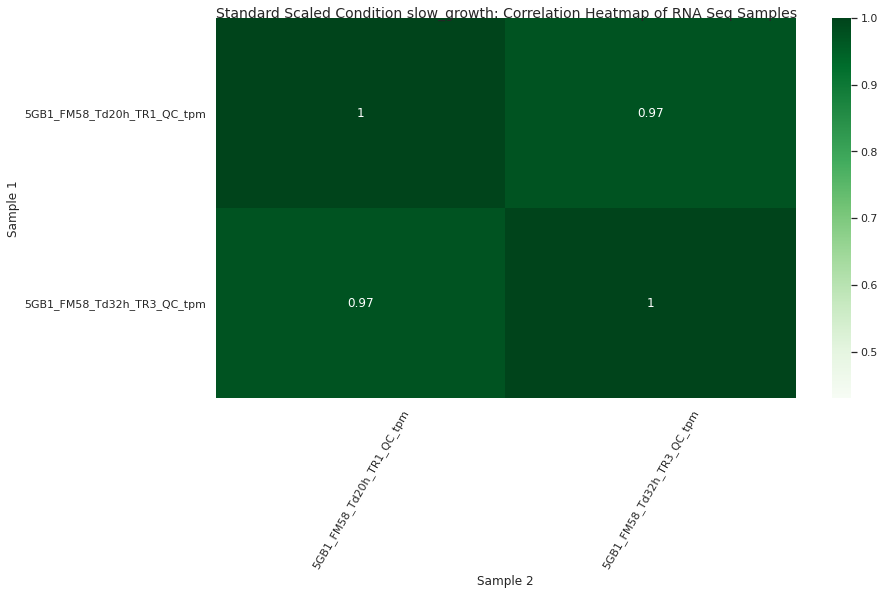

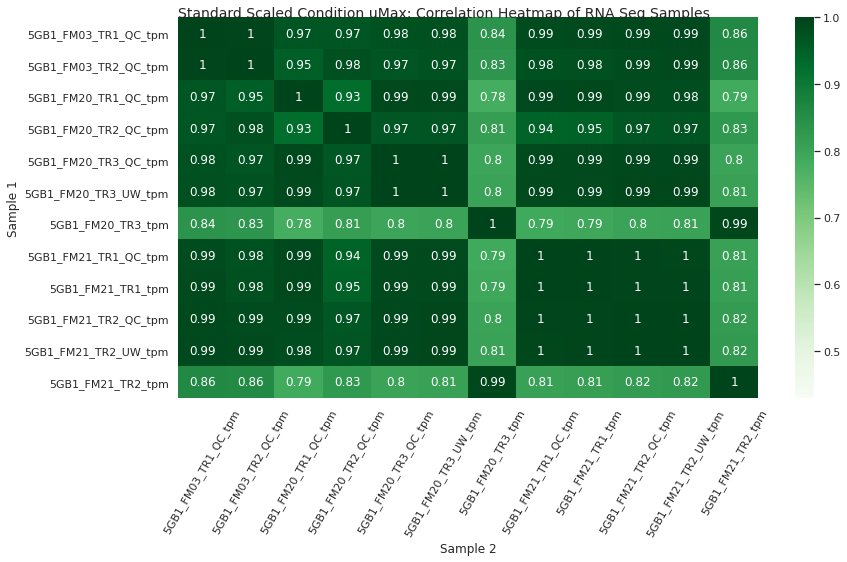

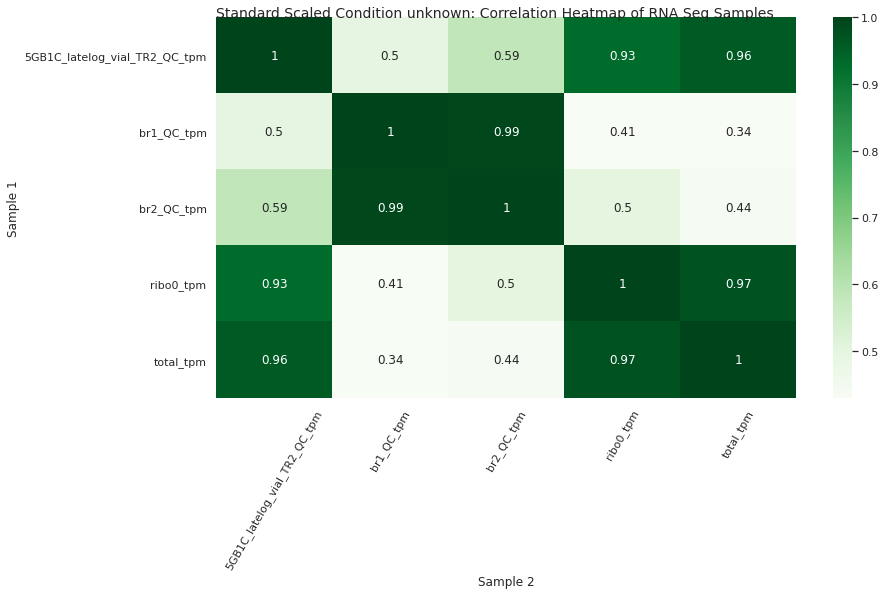

In [139]:

for i, condition in enumerate(list_conditions):
    
    # Filter the dataset of samples (and their correlations) down to selected column
    df_condition_corr = df_sorted_sample_scaled_corr[df_sorted_sample_scaled_corr["Condition 1"] == condition]
    df_condition_corr = df_condition_corr[df_condition_corr["Condition 2"] == condition]
    
    # Create rectangular matrix that uses samples and correlation values from filtered data
    df_mapped_corr = df_condition_corr.pivot('Sample 1', 'Sample 2', 'Corr Value')
    
    # Plot the heatmap
    plt.figure(i)
    plt.text(0, 0, s = "Standard Scaled Condition {}: Correlation Heatmap of RNA Seq Samples".format(condition), fontsize = 14)

    heatmap2 = sns.heatmap(df_mapped_corr, cmap="Greens", annot = True, vmin = 0.4300, vmax = 1.0000) #,  ax=ax[axis_position])

    # Adjust heatmap settings for visual pleasing
    heatmap2.set_xticklabels(heatmap2.get_xticklabels(), rotation=60)
    heatmap2.set_yticklabels(heatmap2.get_yticklabels(), rotation=0)

In [135]:
# OLD HEATMAPS

cur_condition = []

# for i, condition in enumerate(df_sorted.columns): 
#     if condition not in cur_condition: 
#         df_condition = df_scaled_corr.loc[condition]
#         df_condition = df_condition.T.loc[condition]
        
#         #plt.figure(i)
#         #plt.text(0, 0, s = "Standard Scaled Condition {}: Correlation Heatmap of RNA Seq Samples".format(condition), fontsize = 14)
        
#         #sns.heatmap(df_condition, cmap="Greens", annot = True, vmin = 0.4300, vmax = 1.0000) #,  ax=ax[axis_position])
        
#     cur_condition.append(condition)

### 3. Confirmation of Standard Scaling and Raw Relationship

In [137]:
# Confirmation of results

comparison_corr = df_standard_scaled_old.corrwith(df_sorted)
comparison_corr

# Conclusion: confirms that the two are equivalently correlated!

LanzaTech    1.0
LanzaTech    1.0
MeOH         1.0
MeOH         1.0
MeOH         1.0
            ... 
unknown      1.0
unknown      1.0
unknown      1.0
unknown      1.0
unknown      1.0
Length: 98, dtype: float64

## Correlation Expanded

### Looking deeper into the correlation between expression profiles in varying conditions 
- Setting umax as the baseline 
- Varying Analysis: standard ratio AND log ratio

### Standard Ratio

### Log Ratio

***
<a id = "dim_red"></a>

# Dimensionality Reduction

### Strategy: 

Use PCA to plot all the samples relative to each other in 2D space. Color the points by their experimental condition.

* Are there any points that don’t co-locate with others supposedly in its same category together well?
* Try with raw TPM values and standard scaler values
    * Try after filtering out genes that don’t express very highly
    * 0.0 in all conditions?
< 10 tpm in all conditions?
Only the top 10% in all conditions?
Aka If a gene is in the top 10% of genes in any of the conditions, keep it in the analysis. Else filter it out

Repeat 1 but try a different dimensionality reduction method - tSNE, UMAP


## PCA - Principal Component Analysis

In [81]:
df_raw_tpm = df.iloc[:, 10:]
df_raw_tpm

,5GB1_ferm_Ack_QC_tpm,5GB1_ferm_WT_QC_tpm,5GB1_FM03_TR1_QC_tpm,5GB1_FM03_TR2_QC_tpm,5GB1_FM11_TR1_QC_tpm,5GB1_FM11_TR2_QC_tpm,5GB1_FM12_TR1_tpm,5GB1_FM12_TR1_QC_tpm,5GB1_FM12_TR2_tpm,5GB1_FM12_TR2_QC_tpm,...,5GB1_pA9_red_tpm,5GB1_pA9_yellow_tpm,5GB1C-5G-La-BR1_tpm,5GB1C-5G-La-BR2_tpm,5GB1C-5G-N-BR1_tpm,5GB1C-5G-N-BR2_tpm,5GB1C-JG15-La-BR1_tpm,5GB1C-JG15-La-BR2_tpm,5GB1C-JG15-N-BR1_tpm,5GB1C-JG15-N-BR2_tpm
0,2.933003,6.033848,48.864921,52.197450,25.751902,34.928170,28.322788,28.461759,28.479425,29.472757,...,38.557373,38.810668,37.444214,40.246006,40.100118,33.432274,39.880174,38.355431,30.247582,41.248441
1,1.607784,3.895284,51.315629,54.947425,37.216017,40.094206,27.387700,28.648564,26.498988,26.821965,...,52.552767,52.461746,42.676553,49.210083,46.798476,48.142385,45.465136,46.498139,37.152951,52.902410
2,1.415515,2.549771,33.906257,29.979783,21.716802,27.871558,16.570863,15.562811,16.589291,16.958650,...,31.350991,34.914128,21.479309,24.204682,22.171104,22.006566,22.658157,22.753325,19.407103,29.834124
3,3.200081,4.301580,64.584281,72.717824,53.032824,55.595529,36.795081,36.401903,37.513079,35.833478,...,74.848501,80.850761,54.959319,64.911376,59.653059,64.648318,69.119079,65.643179,57.590223,68.306759
4,1.522728,3.797084,74.801354,62.709260,46.348014,57.992363,27.432559,30.380176,26.852591,26.467246,...,50.324948,49.349547,34.539657,36.521074,37.789611,39.358066,38.992158,35.870964,41.462392,40.227192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,2.300157,3.217944,104.488835,103.864151,78.264069,59.685923,58.833576,57.223346,66.382013,69.196352,...,70.918047,92.044879,20.691249,26.000334,20.753333,30.766617,22.101468,19.753259,20.027390,24.508375
4209,5.261582,12.526353,379.686212,401.742811,208.094267,210.820167,204.760175,204.759505,211.282600,218.557992,...,328.789579,403.009110,105.587429,138.423469,100.648922,166.101675,96.169044,93.527806,89.780995,130.851229
4210,9.389775,21.072962,500.129230,495.262554,260.011454,331.355028,300.766500,309.148602,312.637538,317.603906,...,301.203428,329.903989,69.198876,75.440610,62.460976,59.523445,47.641158,60.667488,55.739018,66.415222
4211,21.657488,42.254357,1191.565348,1232.784967,666.589153,860.248081,828.322141,819.209523,810.533604,835.528579,...,550.448048,679.393946,202.139374,195.134615,214.993010,259.828426,134.795621,160.260255,174.197473,164.123473


In [82]:
# Learned from videos: 
#     - https://www.youtube.com/watch?v=QdBy02ExhGI
#     - https://www.youtube.com/watch?v=FgakZw6K1QQ&t=26s

from sklearn.decomposition import PCA

pca = PCA(n_components=2)

In [98]:
dim_reduced_raw = pca.fit_transform(df_raw_tpm)

df_dim_reduced_raw = pd.DataFrame(dim_reduced_raw)
df_dim_reduced_raw
# create dataframe with array + keep track of conditions so that its easy to grab the colors for plotting

,0,1
0,-1836.151957,205.222774
1,-1760.172071,158.689113
2,-1936.381085,241.336897
3,-1710.226623,166.550554
4,-1817.233556,185.488795
...,...,...
4208,-1675.702127,212.360579
4209,-142.467600,-299.691296
4210,79.304610,-272.238115
4211,4185.296933,-1340.942412


<function matplotlib.pyplot.loglog(*args, **kwargs)>

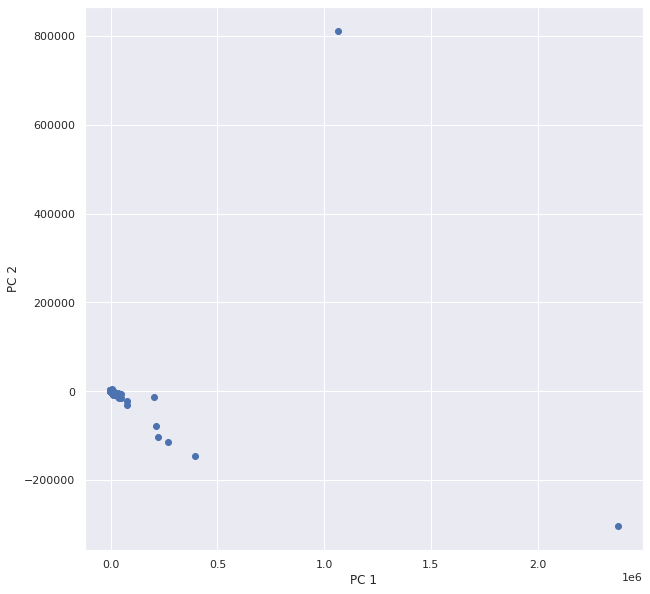

In [86]:
plt.figure(figsize=(10,10))

plt.scatter
plt.scatter(df_dim_reduced_raw[:,0], df_dim_reduced_raw[:,1]) #, c = lambda x: sample2condition.get(x))
plt.xlabel("PC 1")
plt.ylabel("PC 2")

plt.loglog
# plt.xlim(right = 500000)
# plt.ylim(bottom=-200000, top = 100)

#make sure to log scale (compare the two) + limiting the x and y axes would work
#altair => hover over points for the gene names ---> helpful for exploration

In [111]:
# principal components 1 and 2
alt.Chart(df_dim_reduced_raw).mark_point(size=500).encode(
    x='pc1:Q',
    y='pc2:Q',
    tooltip=['exp_condition:N'],
    color='exp_condition:N'
).interactive()

alt.Chart(...)

### tSNE Method

### UMAP Method

***
<a id = "clustering"></a>

# Clustering

### Determine if the computer-generated clustering reveals outliers
- Notably, check if the outlier samples detected in the correlation analysis are apparent through this method!

<h4>k-means clustering</h4>

<h4>k-NN</h4>

<h4>DBSCAN</h4>

***
<a id = "practice"></a>

# Practice Condition Graphs Produced
##### Plot Description 
* Figure A
    * Copper Amounts (noCu, lowCu)
* Figure B
    * Lanthanide Amounts (noCu, lowCu)

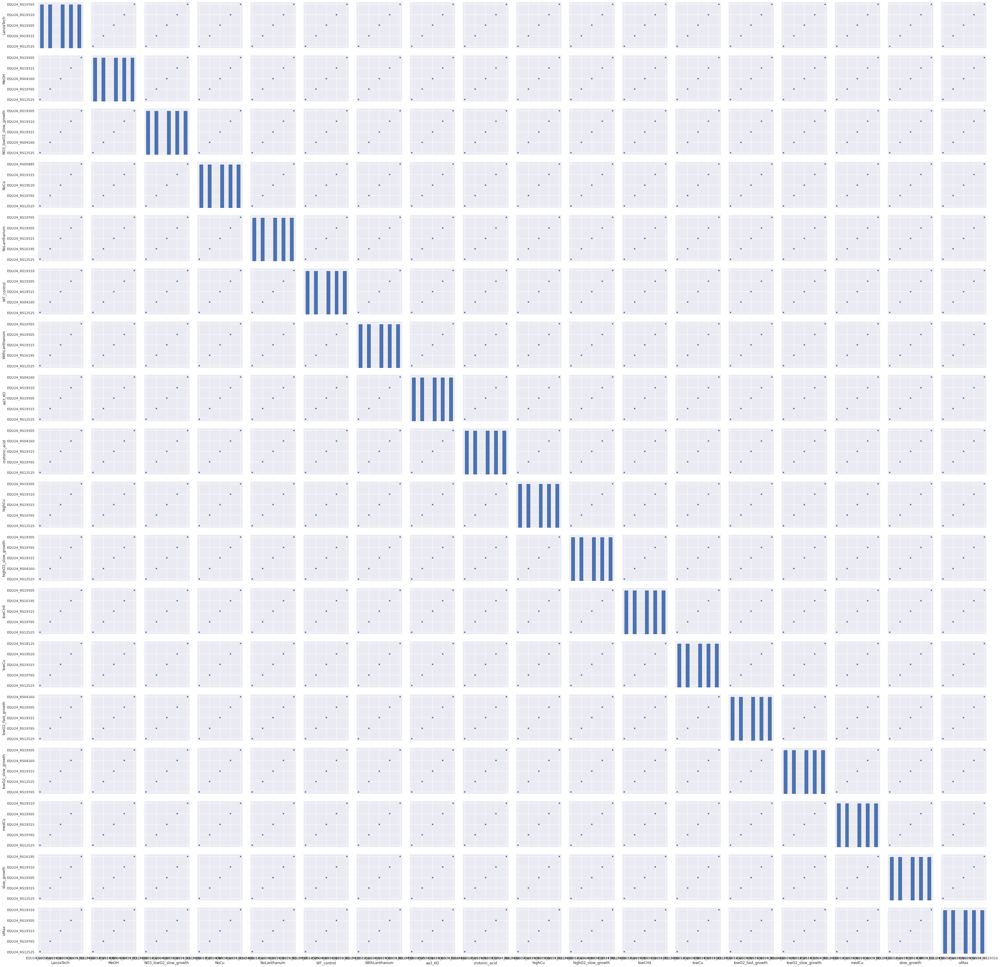

In [17]:
# Histogram distribution of top 5 loci for each experimental condition

pl2 = sns.pairplot(df_top_loci.T, vars=df_top_loci.T.columns[:-1])

In [ ]:
# correlation (Pearson's) --> uses covariance & displaying covariance table as a heatmap w/ seaborn

pc = df_Avg[:-1].corr()

hm = sns.heatmap(pc, annot = True, annot_kws = {'size' : 5})

print("done!")

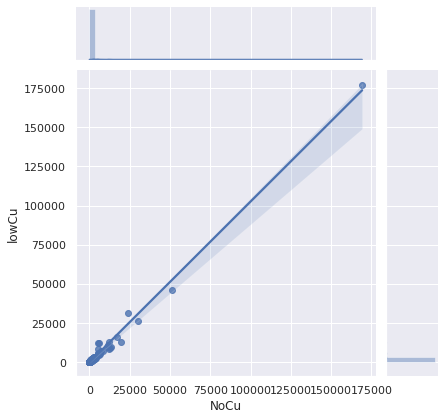

In [17]:
# Figure A

#Compare differences between copper amounts in testing conditions
pl3 = sns.jointplot("NoCu", "lowCu", data = df_Avg.T,  kind='reg')

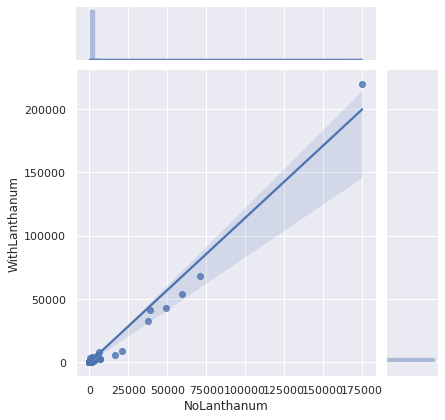

In [18]:
# Figure B

#Compare differences between lanthanum amounts in testing conditions
pl4 = sns.jointplot("NoLanthanum", "WithLanthanum", data = df_Avg.T, kind = 'reg')

# pl4.ax_joint.set_xscale('log')
# pl4.ax_joint.set_yscale('log')

# plt.xlim(0, 1000)
# plt.ylim(0,1000)

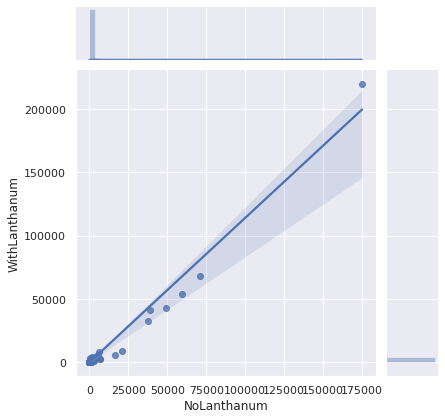

In [19]:
# Figure B --> varied x-axis for scale

#Compare differences between copper amounts in testing conditions
pl3 = sns.jointplot("NoLanthanum", "WithLanthanum", data = df_Avg.T, kind='reg')